# Exploratory Data Analysis on Joined Data
Notebook to perform preliminar analysis on data on BigQuery.<br>
Data involved are the results of join performed on BigQuery and saved intto Dataset JOINED_DATA.

### Data Description

JOINED_DATA contains 3 tables:
- <b>ANAGRAFICA_ARKIMET_METEO</b>: it contains all the anagrafica infos about pol, arkimet and meteo stations.
- <b>ALL_METEO</b>: it contains all the data about meteo from both arkimet and meteo tables, such as: tmin, tmax, precipitazioni, B_Codes.
- <b>POL_DAT</b>: it contains all the data about pollen (concentration and count).

<h3>Import</h3>

In [1]:
import calendar
from tqdm.auto import tqdm
import json
import pandas as pd
import numpy as np
import datetime
from datetime import timedelta
from google.cloud import bigquery
import matplotlib.pyplot as plt
import plotly.graph_objects as go
from plotly.subplots import make_subplots
import plotly.express as px
import ipywidgets as widgets
import scipy.stats
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.metrics import precision_recall_fscore_support
from sklearn.metrics import mean_squared_error
import seaborn as sns
from collections import Counter

import warnings
warnings.filterwarnings('ignore')

my_cmap = plt.get_cmap("Paired")

<h3>Config</h3>

In [2]:
# Config

PROJECT_ID = 'arpae-prod-ml'

# BigQuery
JOINED_BQ_DATASET = 'JOINED_DATA'
JOINED_DATA_TABLE = "ALL_METEO_FEATS_POL_DAT"
JOINED_WEEK_DATA_TABLE = "ALL_METEO_WEEK_FEATS_POL_DAT"

# Paths
BCODES_PATHS = "data/b_codes.json"

# Layout
COLOR_PALETTE = px.colors.qualitative.Prism


<h3>Methods</h3>

In [3]:
# # Read Methods

def _run_query(client, query): 
    df = client.query(query).to_dataframe()
    return df

def _create_station_widget(df):
    station_ids = df.station_id.sort_values().unique()
    station_wdgt = widgets.Dropdown(options=station_ids, description='Station Id:', layout={"width":"50%"})
    return station_wdgt

def _create_pol_var_id_widget(df):
    pol_var_ids = df.pol_var_id.sort_values().unique()
    pol_wdgt = widgets.Dropdown(options=pol_var_ids, description='Pol var id:', layout={"width":"50%"})
    return pol_wdgt

# 1. Config

<h4>1.1 Config BigQuery</h4>

In [4]:
# Setup Client

bq_client = bigquery.Client()
bq_client

# 2. Read Data

<h4>2.2 Read Tables</h4>

In [5]:
# Load B_CODES

sql = f"SELECT * FROM `{PROJECT_ID}.SAMPLE_DATA.B_CODES` WHERE eligible IS true"
b_codes = _run_query(bq_client, sql)

print(b_codes.shape)
b_codes.head(3)

(33, 3)


,var_id,var_descr,eligible
0,B48026,"Mirtacee_Mirtacee indistinte, POLLEN/M**3",True
1,B48006,"Composite_Artemisia, POLLEN/M**3",True
2,B48041,"Spore fungine_Stemphylium, POLLEN/M**3",True


In [6]:
# Load BCODE_SOGLIE

sql = f"SELECT * FROM `{PROJECT_ID}.SAMPLE_DATA.BCODE_SOGLIE`"
b_codes_soglie = _run_query(bq_client, sql)
b_codes_soglie.head(3)

,b_code,basso,medio,alto,CAL_01_JAN,CAL_02_FEB,CAL_03_MAR,CAL_04_APR,CAL_05_MAY,CAL_06_JUN,CAL_07_JUL,CAL_08_AUG,CAL_09_SEP,CAL_10_OCT,CAL_11_NOV,CAL_12_DEC
0,B48066,0.0,0.0,0,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>
1,B48081,3.0,25.0,50,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>
2,B48082,3.0,25.0,50,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>


In [7]:
# Load all meteo and pollen data

sql = f"""
    SELECT DISTINCT *
    FROM `{PROJECT_ID}.{JOINED_BQ_DATASET}.{JOINED_DATA_TABLE}`
    WHERE pol_var_id IN {tuple(b_codes.var_id)}
    ORDER BY station_id, pol_var_id, date
"""

df = _run_query(bq_client, sql)

print(df.shape)
df.head(3)

(1362096, 30)


,station_id,date,B13011_min,B13011_max,B13011_mean,B13011_std,B14198_min,B14198_max,B14198_mean,B14198_std,...,arkimet_id,arkimet_lat,arkimet_lon,meteo_id,pol_var_id,pol_value,modified,pol_var_descr,week,year
0,1,2006-03-01,0.0,0.0,0.0,0.0,-11.0,588.0,138.76,200.669770,...,Bologna urbana,44.5008,11.3288,01421,B48001,0.0,1,"Graminacee_Graminacee indistinte, POLLEN/M**3",9,2006
1,1,2006-03-02,0.0,0.0,0.0,0.0,-6.0,351.0,61.56,98.767015,...,Bologna urbana,44.5008,11.3288,01421,B48001,0.0,1,"Graminacee_Graminacee indistinte, POLLEN/M**3",9,2006
2,1,2006-03-03,0.0,0.0,0.0,0.0,-5.0,406.0,87.12,133.675702,...,Bologna urbana,44.5008,11.3288,01421,B48001,0.0,1,"Graminacee_Graminacee indistinte, POLLEN/M**3",9,2006


In [8]:
# Load all WEEKLY meteo and pollen data

sql = f"""
    SELECT DISTINCT *
    FROM `{PROJECT_ID}.{JOINED_BQ_DATASET}.{JOINED_WEEK_DATA_TABLE}`
    WHERE pol_var_id IN {tuple(b_codes.var_id)}
    ORDER BY station_id, pol_var_id, year, week
"""

df_weekly = _run_query(bq_client, sql)

print(df_weekly.shape)
df_weekly.head(3)

(206786, 32)


,station_id,week,year,init_date,end_date,B13011_min,B13011_max,B13011_mean,B13011_std,B14198_min,...,station_H_piano_strada,station_H_mslm,arkimet_id,arkimet_lat,arkimet_lon,meteo_id,pol_var_id,pol_var_descr,POL_mean,POL_sum
0,1,9,2006,2006-02-26,2006-03-04,0.0,3.4,0.011475,0.141370,-13.0,...,80.0,101.0,Bologna urbana,44.5008,11.3288,01421,B48001,"Graminacee_Graminacee indistinte, POLLEN/M**3",0.0,0.0
1,1,10,2006,2006-03-05,2006-03-11,0.0,23.4,0.173770,1.353097,-14.0,...,80.0,101.0,Bologna urbana,44.5008,11.3288,01421,B48001,"Graminacee_Graminacee indistinte, POLLEN/M**3",0.0,0.0
2,1,11,2006,2006-03-12,2006-03-18,0.0,3.0,0.019204,0.162358,-12.0,...,80.0,101.0,Bologna urbana,44.5008,11.3288,01421,B48001,"Graminacee_Graminacee indistinte, POLLEN/M**3",0.0,0.0


# 3. Prepare Data

In [9]:
# join b_codes_soglie
df = pd.merge(df, b_codes_soglie, how="left", left_on="pol_var_id", right_on="b_code")
df_weekly = pd.merge(df_weekly, b_codes_soglie, how="left", left_on="pol_var_id", right_on="b_code")

print(df.shape)
print(df_weekly.shape)

(1362096, 46)
(206786, 48)


In [10]:
# Sort dataframes
df.sort_values(["station_id", "pol_var_id", "date"], inplace=True)
df_weekly.sort_values(["station_id", "pol_var_id", "init_date"], inplace=True)

In [11]:
# Convert dates to datetime format
df.date = pd.to_datetime(df.date)
df.date = pd.to_datetime(df.date)
df["month"] = df.date.dt.month
df["day"] = df.date.dt.day

df_weekly.init_date = pd.to_datetime(df_weekly.init_date)
df_weekly.end_date = pd.to_datetime(df_weekly.end_date)

# 4. Meteo historical data

The folowing analysis is made from 2013 to last available date

In [12]:
from_year = 2015

df_weather = df[df.year >= from_year]
print(df_weather.shape)

(557463, 48)


## 4.1 Plotting overall monthly precipitation

* Sum of all monthly precipitations per year
* Displaying precipitation trend changes over years

In [13]:
prec_monthly_sum = df_weather.groupby(["year", "month"])["PREC"].sum()
prec_monthly_sum = prec_monthly_sum.reset_index()
prec_monthly_sum.year = prec_monthly_sum.year.astype(int)
print(prec_monthly_sum.shape)
prec_monthly_sum.head(3)

(84, 3)


,year,month,PREC
0,2015,1,3826.4
1,2015,2,22050.5
2,2015,3,29219.9


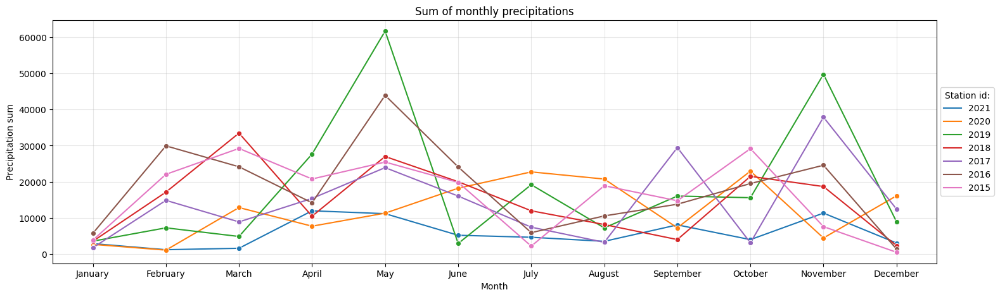

In [14]:
prec_monthly_sum.sort_values("year", ascending=False, inplace=True)
plt.figure(figsize=(18,5))
plt.title("Sum of monthly precipitations")
sns.lineplot(data=prec_monthly_sum, x="month", y="PREC", marker='o', hue=prec_monthly_sum.year.astype(str))
plt.xlabel("Month")
plt.ylabel("Precipitation sum")
plt.legend(title="Station id:", bbox_to_anchor=(1.07, .5), loc="center right")
plt.xticks(np.arange(1,13), calendar.month_name[1:])
plt.grid(alpha=.3)
plt.show()

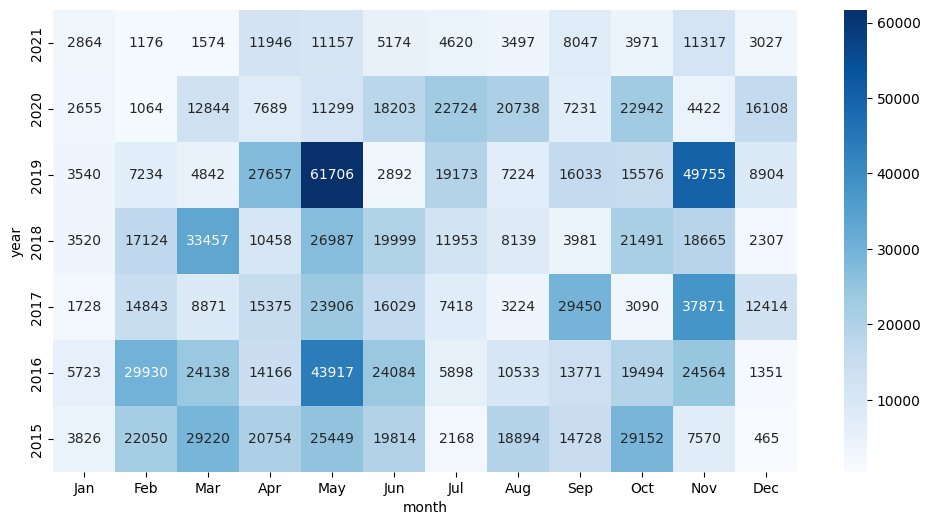

In [15]:
plt.figure(figsize=(12,6))
pivot = prec_monthly_sum.pivot(index='year', columns='month', values='PREC').sort_index(ascending=False)
sns.heatmap(pivot, cmap="Blues", fmt=".0f", xticklabels=calendar.month_abbr[1:], annot=True);

## 4.2 Plotting all stations precipitations over month days

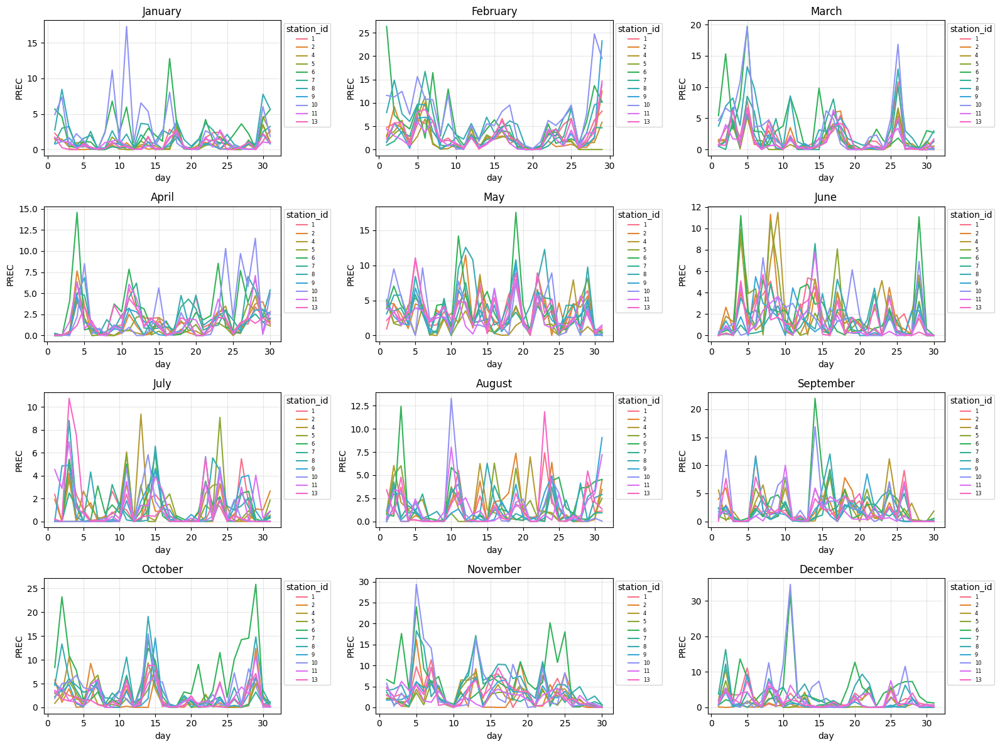

In [16]:
rows, cols = 4, 3
fig, axs = plt.subplots(rows, cols, figsize=(16,12), squeeze=False)

for subpltn, (month, data) in enumerate(df_weather.groupby(["month"])):
    data = data.copy()
    data.drop_duplicates(["station_id", "date", "PREC"], inplace=True)
    data.sort_values(["station_id", "day"], inplace=True)
    data.set_index("day", inplace=True)
    ax = axs[divmod(subpltn, cols)]
    sns.lineplot(data=data, x="day", y="PREC", hue=data.station_id.astype(str), ci=None, ax=ax)
    ax.set_title(f"{calendar.month_name[month]}")
    ax.grid(alpha=.3)
    ax.legend(title="station_id", bbox_to_anchor=(1.22, 1), loc="upper right", fontsize=6)

for subpltn in range(subpltn+1, rows*cols): fig.delaxes(axs.flatten()[subpltn]) # removing empty plots from subplot grid
plt.tight_layout()
plt.show();

## 4.3 Averaging days, getting one value per month

In [17]:
prec_monthly_sum = df_weather.groupby(["station_id", "year", "month"])["PREC"].sum()
prec_monthly_sum = prec_monthly_sum.reset_index()
prec_monthly_sum.head(3)

,station_id,year,month,PREC
0,1,2015,1,347.0
1,1,2015,2,2365.5
2,1,2015,3,3852.8


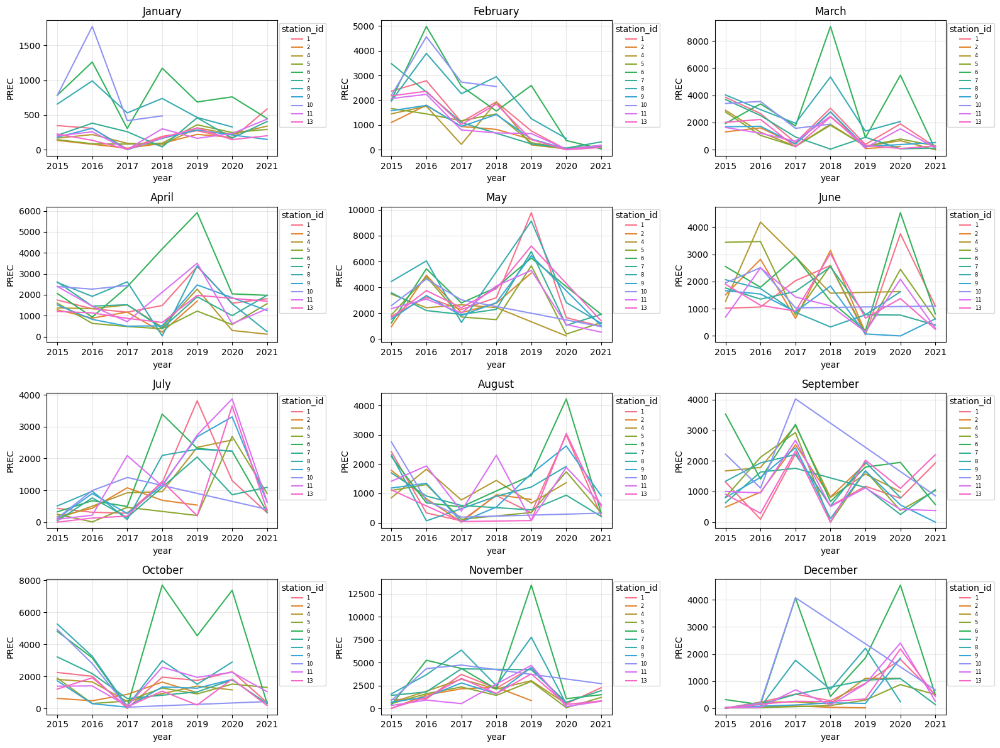

In [18]:
rows, cols = 4, 3
fig, axs = plt.subplots(rows, cols, figsize=(16,12), squeeze=False)
for subpltn, (month, data) in enumerate(prec_monthly_sum.groupby(["month"])):
    data = data.copy()
    data.sort_values(["station_id", "month"], inplace=True)
    data.set_index("month", inplace=True)
    ax = axs[divmod(subpltn, cols)]
    sns.lineplot(data=data, x="year", y="PREC", hue=data.station_id.astype(str), ci=None, ax=ax)
    ax.set_title(f"{calendar.month_name[month]}")
    ax.legend(title="station_id", bbox_to_anchor=(1.22, 1), loc="upper right", fontsize=6)
    ax.grid(alpha=.3)

for subpltn in range(subpltn+1, rows*cols): fig.delaxes(axs.flatten()[subpltn]) # removing empty plots from subplot grid
plt.tight_layout()
plt.show();

## 4.4 Plotting station yearly data

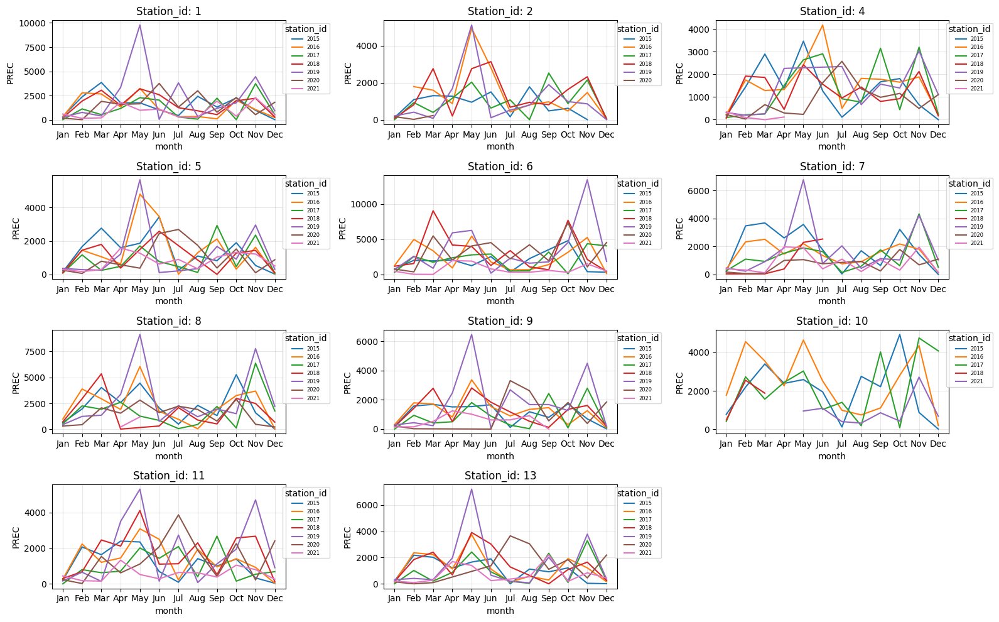

In [19]:
rows, cols = 4, 3
fig, axs = plt.subplots(rows, cols, figsize=(16,10), squeeze=False)

for subpltn, (station_id, data) in enumerate(prec_monthly_sum.groupby(["station_id"])):
    data = data.copy()
    data.sort_values(["year", "month"], inplace=True)
    data.set_index("month", inplace=True)
    ax = axs[divmod(subpltn, cols)]
    sns.lineplot(data=data, x="month", y="PREC", hue=data.year.astype(str), ci=None, ax=ax)
    ax.set_title(f"Station_id: {station_id}")
    ax.set_xticks(np.arange(1, data.index.max()+1, 1), labels=calendar.month_abbr[1:])
    ax.legend(title="station_id", bbox_to_anchor=(1.2, 1), loc="upper right", fontsize=6)
    ax.grid(alpha=.3)

for subpltn in range(subpltn+1, rows*cols): fig.delaxes(axs.flatten()[subpltn]) # removing empty plots from subplot grid
plt.tight_layout()
plt.show();

## 4.5 Plotting overall monthly temperature

* Mean of all monthly temperatures per year
* Displaying trend changes over years

In [20]:
temp_monthly_sum = df_weather.groupby(["year", "month"])["TEMP_mean"].mean()
temp_monthly_sum = temp_monthly_sum.reset_index()
temp_monthly_sum.year = temp_monthly_sum.year.astype(int)

print(temp_monthly_sum.shape)
temp_monthly_sum.head(3)

(84, 3)


,year,month,TEMP_mean
0,2015,1,4.354452
1,2015,2,4.250078
2,2015,3,8.485741


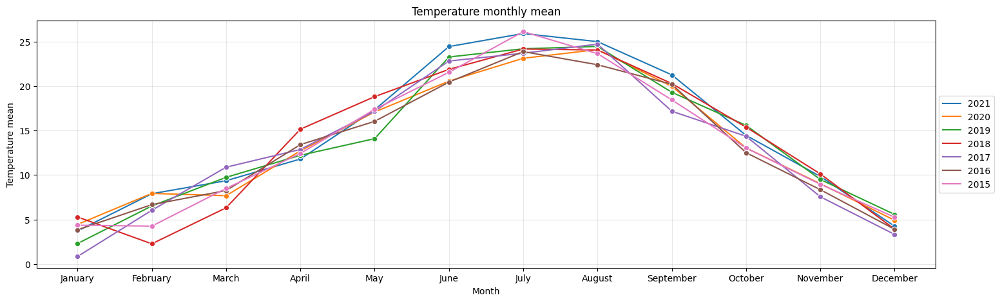

In [21]:
temp_monthly_sum.sort_values("year", ascending=False, inplace=True)
plt.figure(figsize=(18,5))
plt.title("Temperature monthly mean")
sns.lineplot(data=temp_monthly_sum, x="month", y="TEMP_mean", marker='o', hue=temp_monthly_sum.year.astype(str))
plt.xlabel("Month")
plt.ylabel("Temperature mean")
plt.legend(bbox_to_anchor=(1.07, .5), loc="center right")
plt.xticks(np.arange(1,13), calendar.month_name[1:])
plt.grid(alpha=.3)
plt.show()

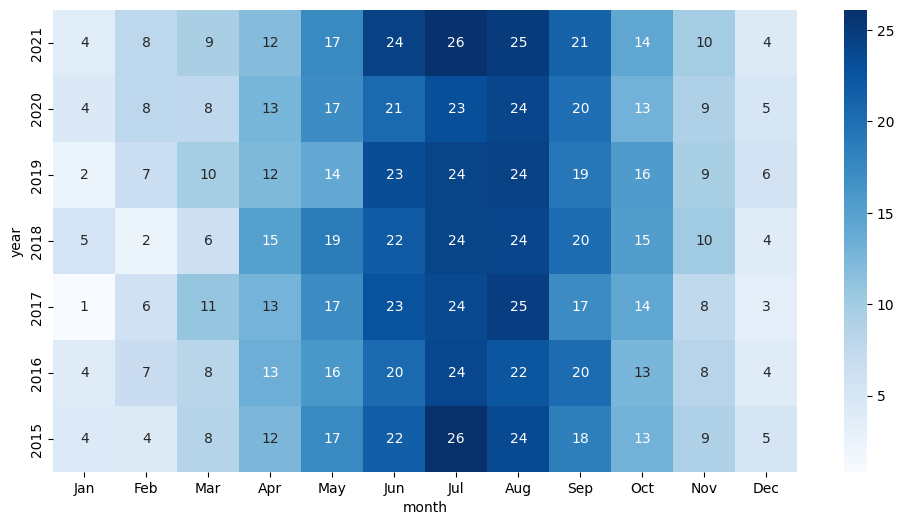

In [22]:
plt.figure(figsize=(12,6))
pivot = temp_monthly_sum.pivot(index='year', columns='month', values='TEMP_mean').sort_index(ascending=False)
sns.heatmap(pivot, cmap="Blues", fmt=".0f", xticklabels=calendar.month_abbr[1:], annot=True);

## 4.6 Plotting all stations temperature over month days

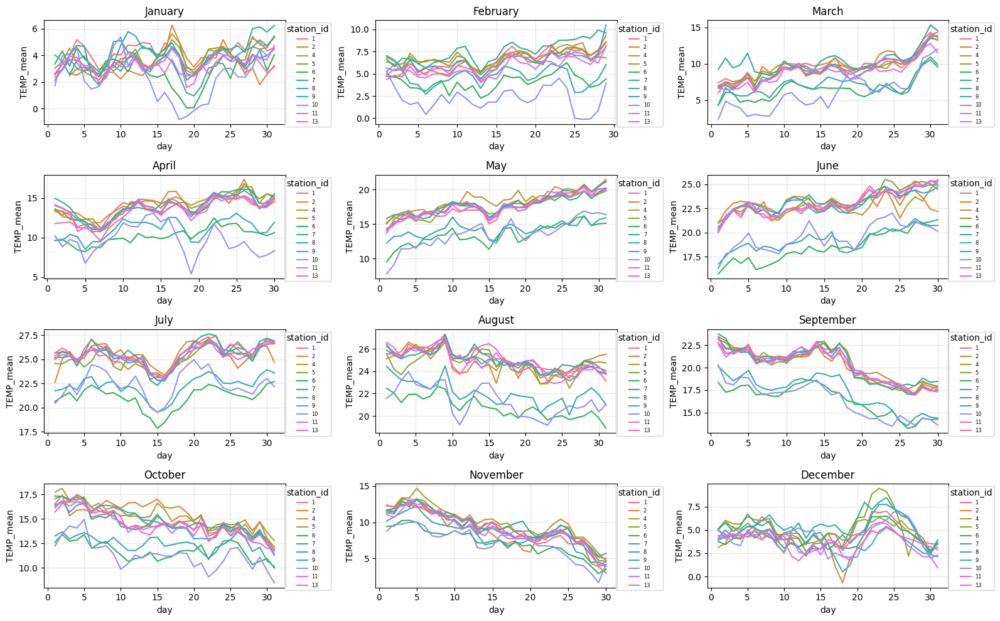

In [23]:
rows, cols = 4, 3
fig, axs = plt.subplots(rows, cols, figsize=(16,10), squeeze=False)

for subpltn, (month, data) in enumerate(df_weather.groupby(["month"])):
    data = data.copy()
    data.drop_duplicates(["station_id", "date", "TEMP_mean"], inplace=True)
    data.sort_values(["station_id", "day"], inplace=True)
    data.set_index("day", inplace=True)
    ax = axs[divmod(subpltn, cols)]
    sns.lineplot(data=data, x="day", y="TEMP_mean", hue=data.station_id.astype(str), ci=None, ax=ax)
    ax.set_title(f"{calendar.month_name[month]}")
    ax.grid(alpha=.3)
    ax.legend(title="station_id", bbox_to_anchor=(1.2, 1), loc="upper right", fontsize=6)

for subpltn in range(subpltn+1, rows*cols): fig.delaxes(axs.flatten()[subpltn]) # removing empty plots from subplot grid
plt.tight_layout()
plt.show();

## 4.7 Plotting overall monthly b_codes

* Mean of all monthly temperatures per year
* Displaying trend changes over years

In [24]:
bocdes_monthly_sum = df_weather.groupby(["year", "month"])["B13011_mean", "B14198_mean"].mean()
bocdes_monthly_sum = bocdes_monthly_sum.reset_index()
bocdes_monthly_sum.year = bocdes_monthly_sum.year.astype(int)

print(bocdes_monthly_sum.shape)
bocdes_monthly_sum.head(3)

(84, 4)


,year,month,B13011_mean,B14198_mean
0,2015,1,0.020387,64.423516
1,2015,2,0.159194,88.418852
2,2015,3,0.089091,150.721853


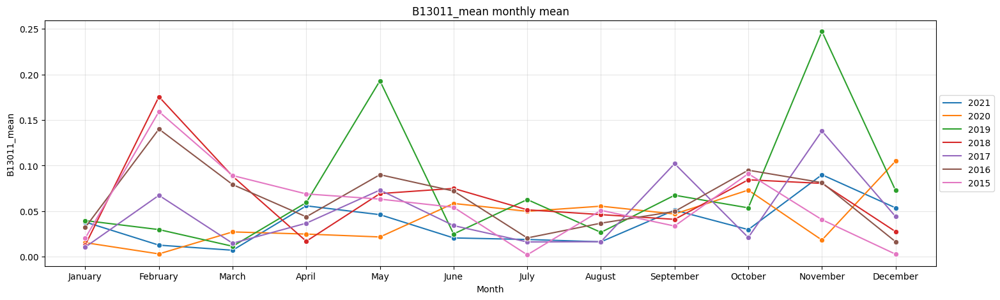

In [25]:
bocdes_monthly_sum.sort_values("year", ascending=False, inplace=True)
plt.figure(figsize=(18,5))
plt.title("B13011_mean monthly mean")
sns.lineplot(data=bocdes_monthly_sum, x="month", y="B13011_mean", marker='o', hue=bocdes_monthly_sum.year.astype(str))
plt.xlabel("Month")
plt.ylabel("B13011_mean")
plt.legend(bbox_to_anchor=(1.07, .5), loc="center right")
plt.xticks(np.arange(1,13), calendar.month_name[1:])
plt.grid(alpha=.3)
plt.show()

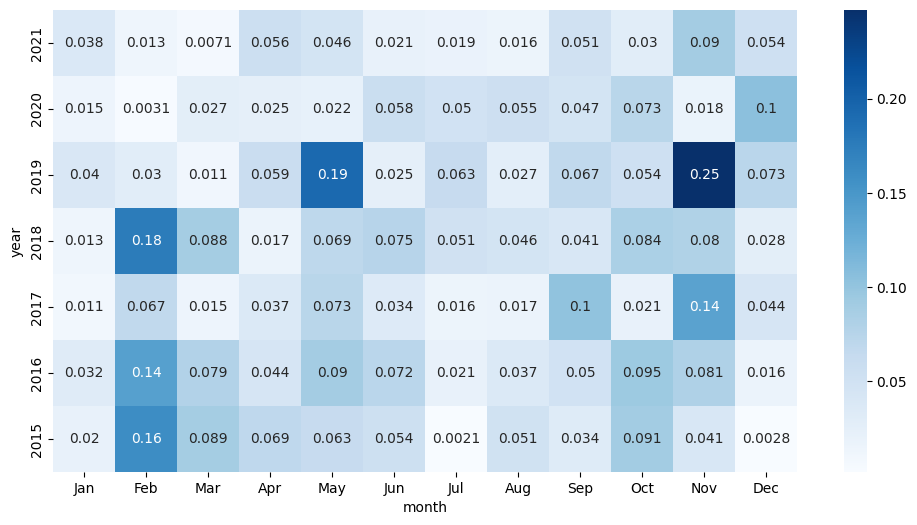

In [26]:
plt.figure(figsize=(12,6))
pivot = bocdes_monthly_sum.pivot(index='year', columns='month', values='B13011_mean').sort_index(ascending=False)
sns.heatmap(pivot, cmap="Blues", xticklabels=calendar.month_abbr[1:], annot=True);

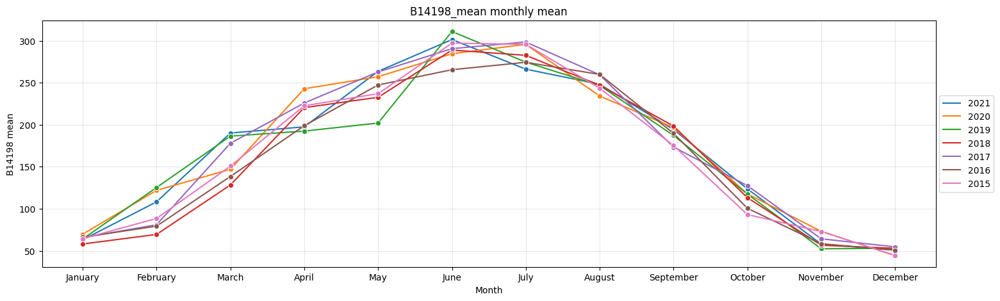

In [27]:
bocdes_monthly_sum.sort_values("year", ascending=False, inplace=True)
plt.figure(figsize=(18,5))
plt.title("B14198_mean monthly mean")
sns.lineplot(data=bocdes_monthly_sum, x="month", y="B14198_mean", marker='o', hue=bocdes_monthly_sum.year.astype(str))
plt.xlabel("Month")
plt.ylabel("B14198 mean")
plt.legend(bbox_to_anchor=(1.07, .5), loc="center right")
plt.xticks(np.arange(1,13), calendar.month_name[1:])
plt.grid(alpha=.3)
plt.show()

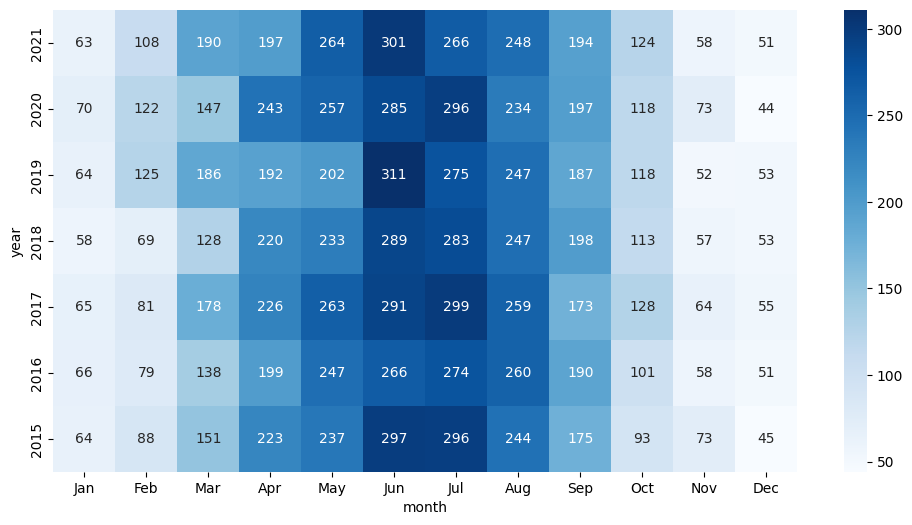

In [28]:
plt.figure(figsize=(12,6))
pivot = bocdes_monthly_sum.pivot(index='year', columns='month', values='B14198_mean').sort_index(ascending=False)
sns.heatmap(pivot, cmap="Blues", fmt=".0f", xticklabels=calendar.month_abbr[1:], annot=True);

# 5. Pollen historical data

In [29]:
def plot_pollen_trends(df):
    df.sort_values("year", ascending=False, inplace=True)
    plt.figure(figsize=(16,5));
    plt.title("pol_value monthly mean");
    sns.lineplot(data=df, x="month", y="pol_value", marker='o', ci=None, hue=df.year.astype(str));
    plt.xlabel("Month");
    plt.ylabel("pol_value mean");
    plt.legend(bbox_to_anchor=(1.07, .5), loc="center right")
    xtickslbl = [calendar.month_abbr[m] for m in sorted(df.month.unique())]
    plt.xticks(sorted(df.month.unique()), xtickslbl);
    plt.grid(alpha=.3);
    display(plt.show());
    
    plt.figure(figsize=(10,6));
    plt.title(f"Monthly Pollen for specie id: {pol_id_wgt.value}")
    pivot = df.pivot(index='year', columns='month', values='pol_value').sort_values("year", ascending=False)
    sns.heatmap(pivot, cmap="Blues", fmt=".0f", annot=True, xticklabels=xtickslbl);
    display(ax);

In [30]:
pol_id_wgt = _create_pol_var_id_widget(df)
display(pol_id_wgt)

Dropdown(description='Pol var id:', layout=Layout(width='50%'), options=('B48001', 'B48002', 'B48003', 'B48005…

,year,month,pol_value
0,2015,3,207.38000
1,2015,4,25321.17000
2,2015,5,35911.42999


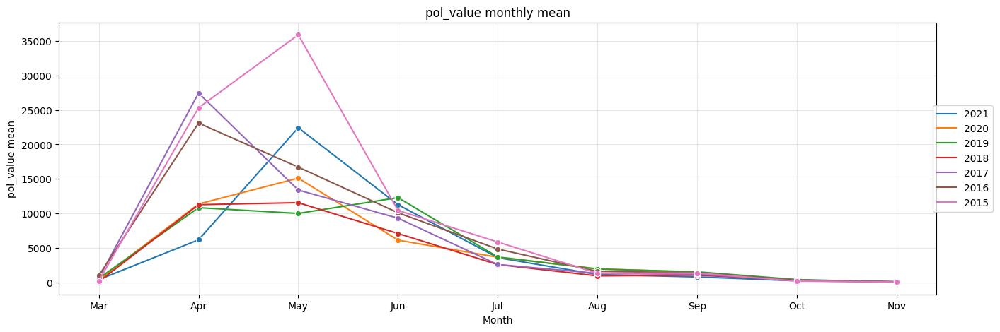

None

<Axes: title={'center': 'December'}, xlabel='day', ylabel='TEMP_mean'>

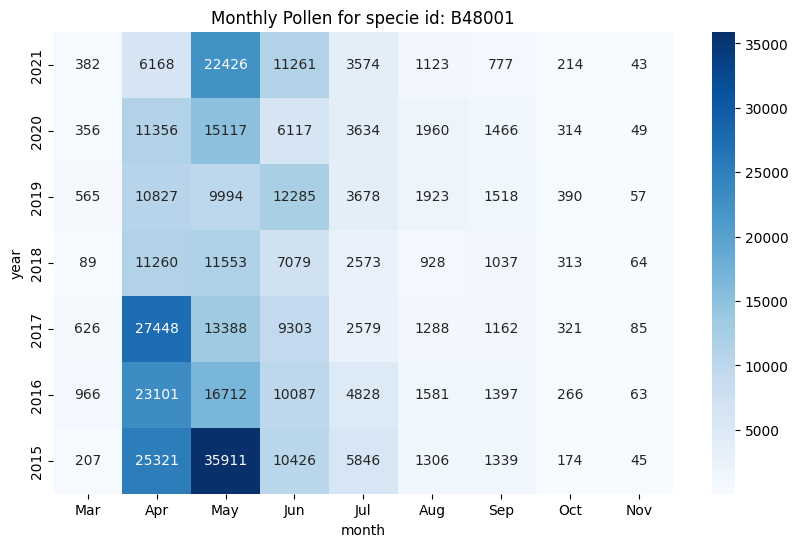

In [31]:
df_pol = df[(df.pol_var_id == pol_id_wgt.value) & (df.year >= from_year)]
df_pol.sort_values(["station_id", "date"], inplace=True)
df_pol = df_pol.groupby(["year","month"])["pol_value"].sum().reset_index()
display(df_pol.head(3));

plot_pollen_trends(df_pol);

In [32]:
def plot_pol_month_range(df, month_frequency=3):
    pol_id = df.pol_var_id.iloc[0]
    bins_dt = pd.date_range(start=df.date.min().replace(day=1), end=df.date.max(), freq=f'{month_frequency}M')
    df_pol_3m = df.groupby(pd.cut(df["date"], bins=bins_dt))["pol_value"].sum().reset_index()

    df_pol_3m["year"] = df_pol_3m.date.apply(lambda d: d.left.year)
    df_pol_3m["year_r"] = df_pol_3m.date.apply(lambda d: d.right.year)
    df_pol_3m["start_month"] = df_pol_3m.date.apply(lambda d: d.left.month)
    df_pol_3m["end_month"] = df_pol_3m.date.apply(lambda d: d.right.month)
    df_pol_3m.start_month = df_pol_3m.start_month.apply(lambda m: calendar.month_abbr[m])
    df_pol_3m.end_month = df_pol_3m.end_month.apply(lambda m: calendar.month_abbr[m])
    df_pol_3m = df_pol_3m[df_pol_3m.year == df_pol_3m.year_r]
    df_pol_3m["month_range"] = df_pol_3m.start_month + "-" + df_pol_3m.end_month
    #df_pol_3m.drop(["date", "year_r", "start_month", "end_month"], axis=1, inplace=True)

    pvt = df_pol_3m.sort_values("date").pivot(index='year', columns='month_range', values='pol_value').sort_values(["year"], ascending=False)
    plt.figure(figsize=(10,6));
    plt.title(f"Month range pollen for specie id: {pol_id}");
    sns.heatmap(pvt, cmap="Blues", fmt=".0f", annot=True);
    display(plt.show());

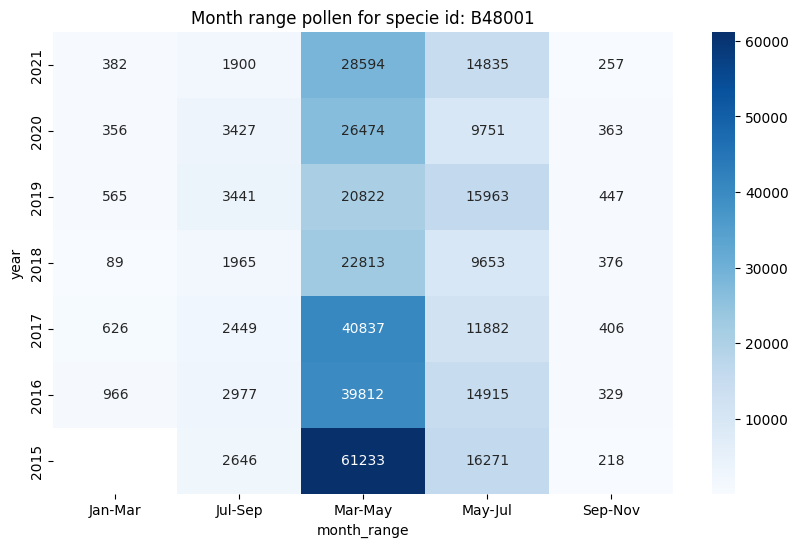

None

In [33]:
df_pol = df[(df.pol_var_id == pol_id_wgt.value) & (df.year >= from_year)]
plot_pol_month_range(df_pol, month_frequency=2);

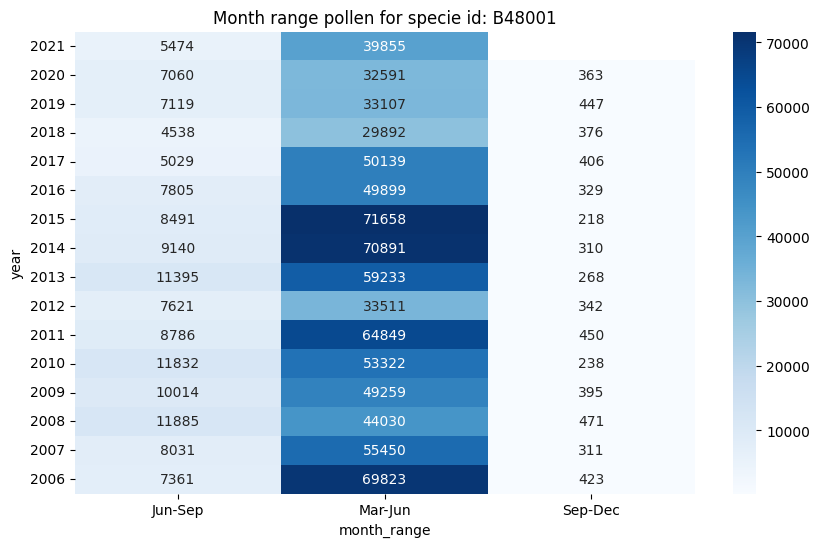

None

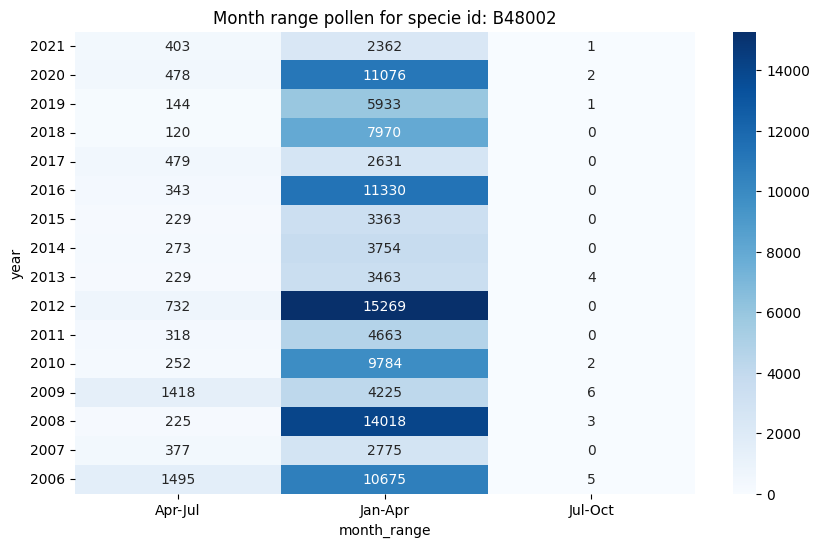

None

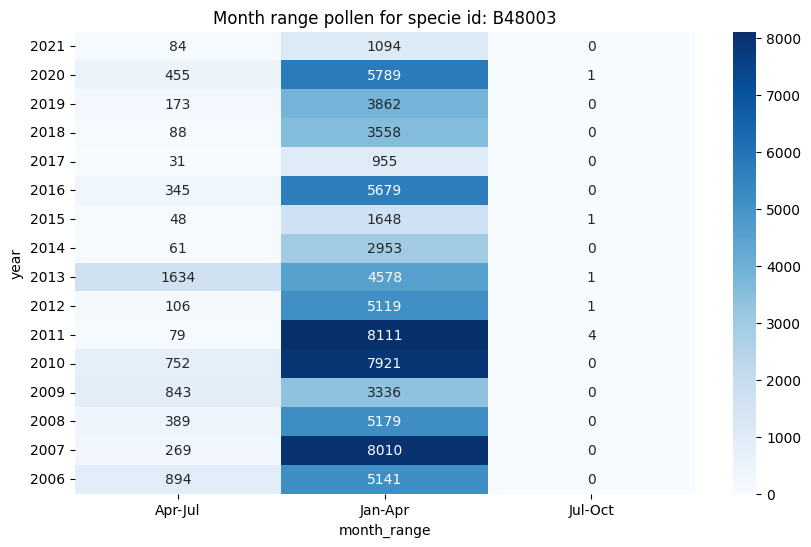

None

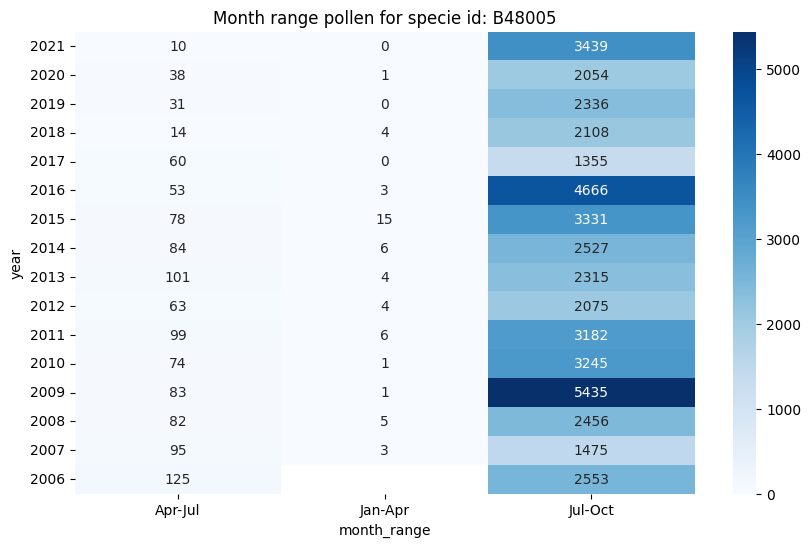

None

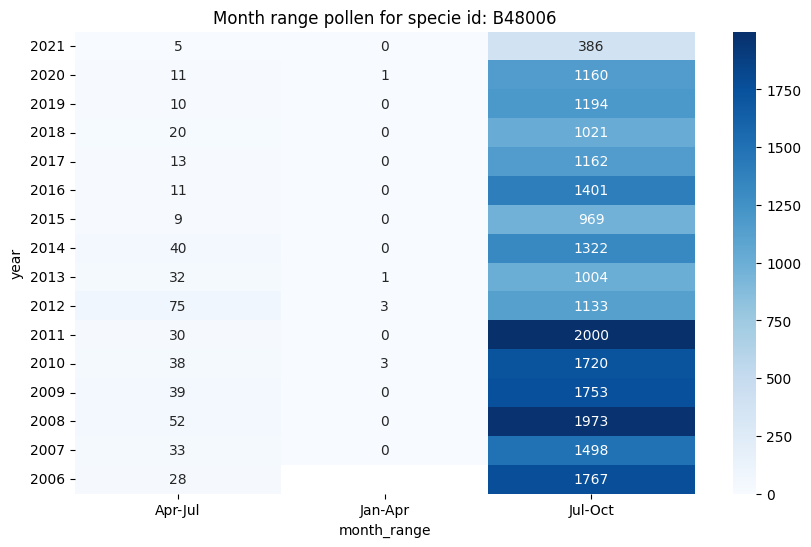

None

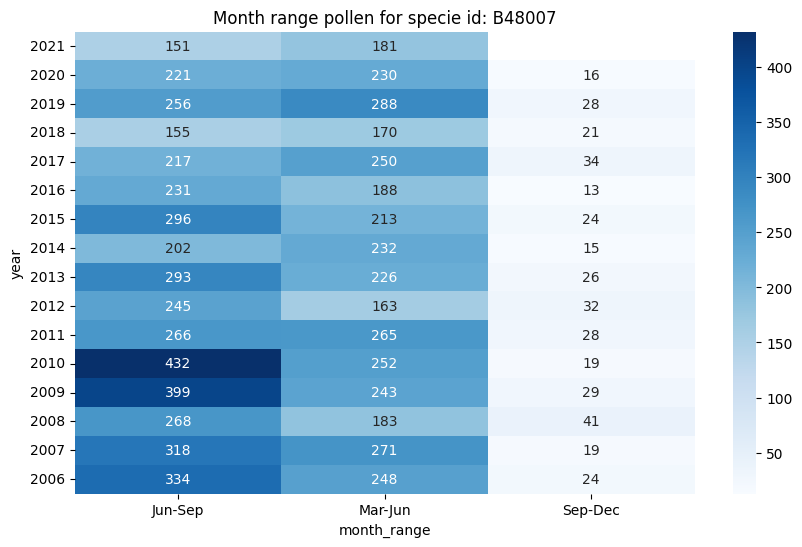

None

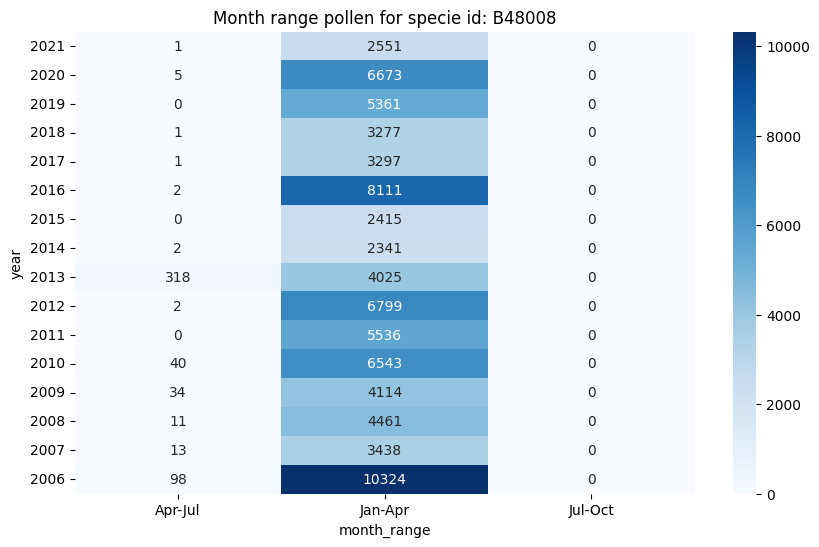

None

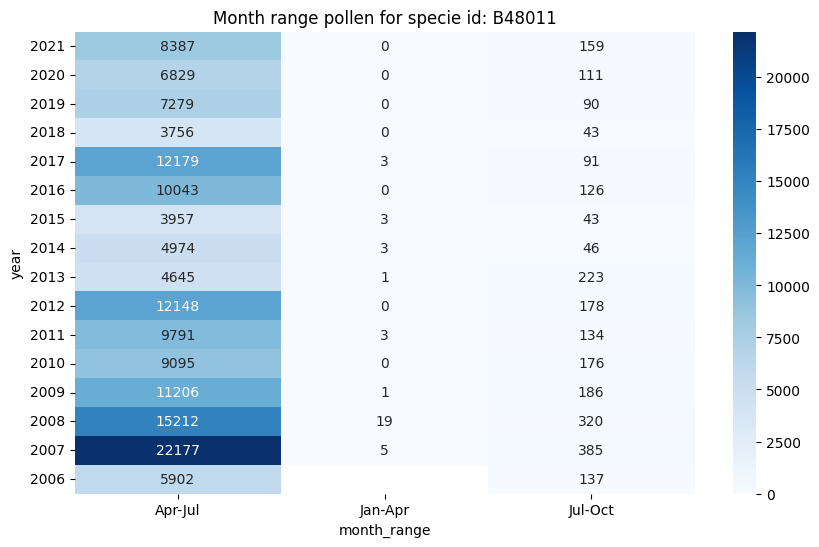

None

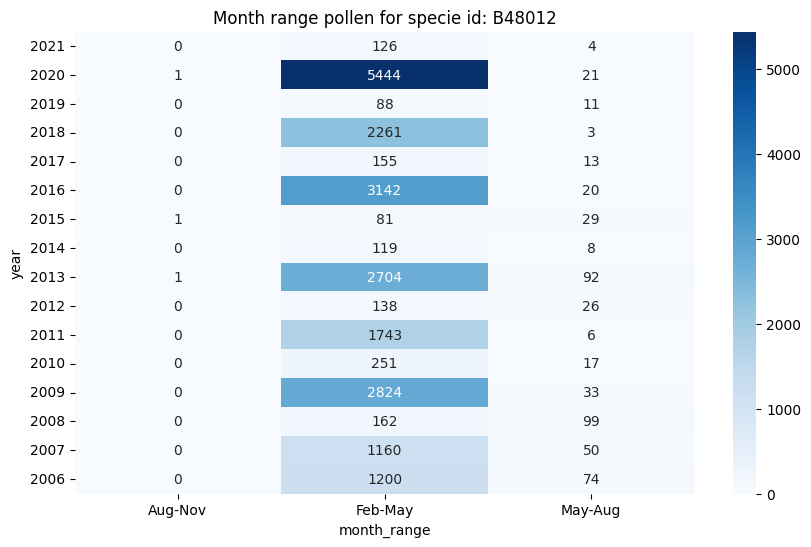

None

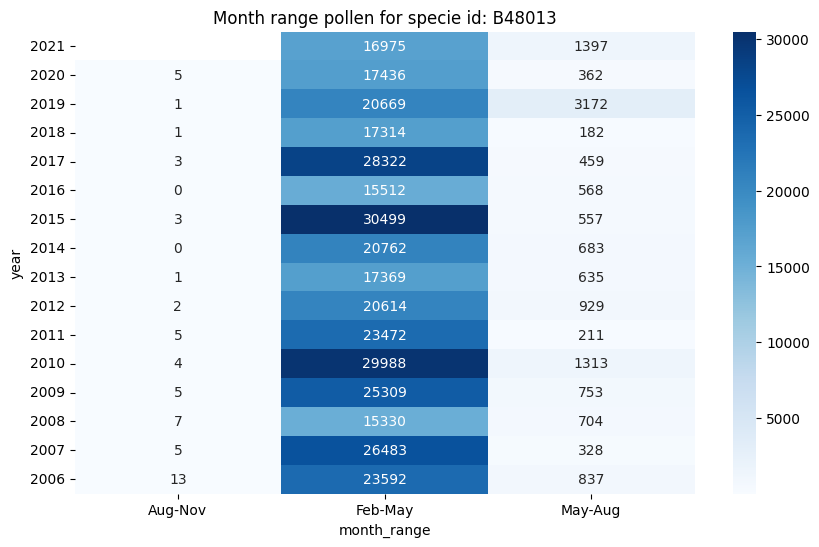

None

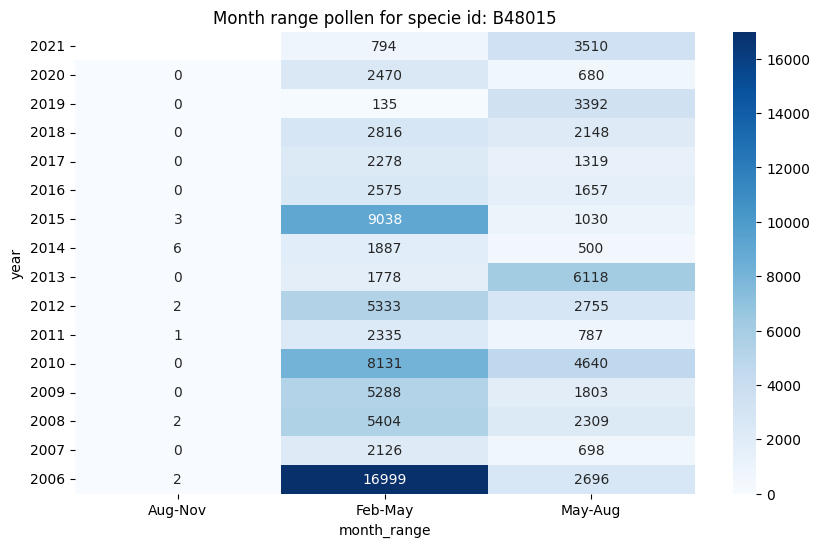

None

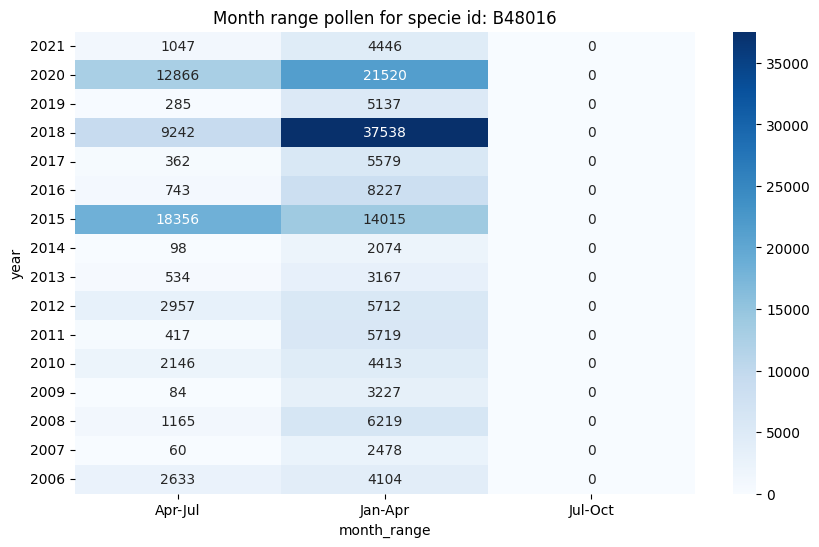

None

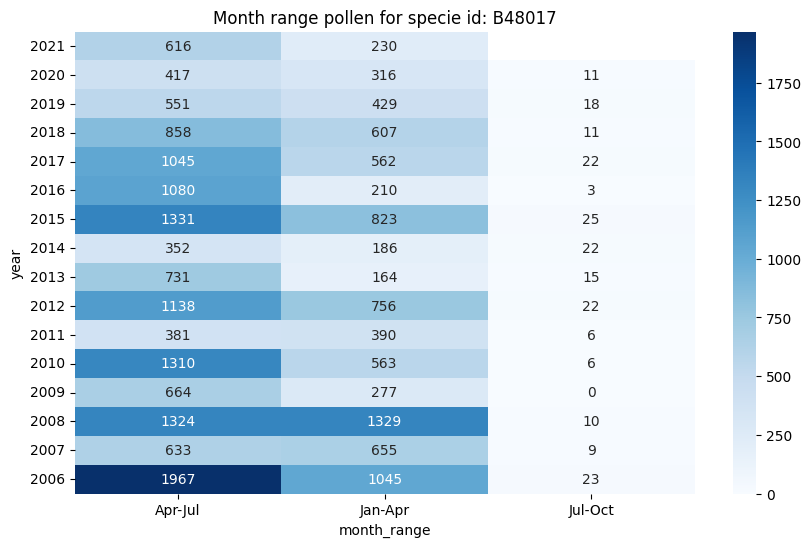

None

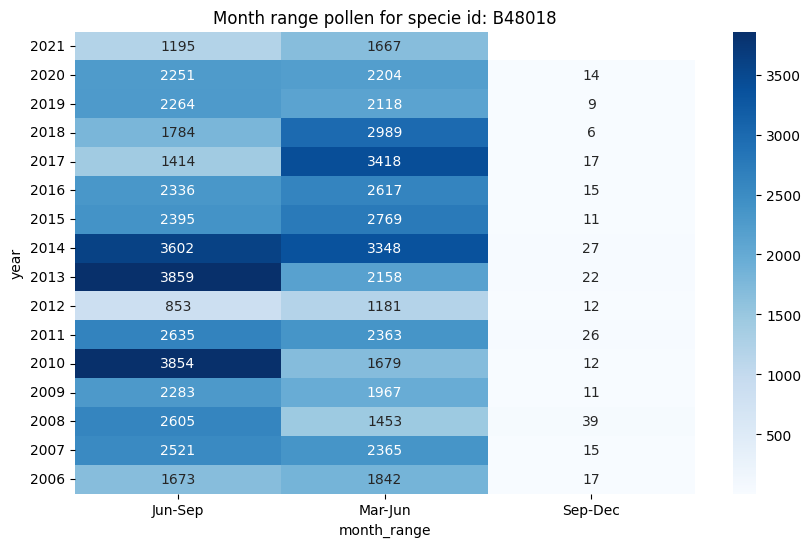

None

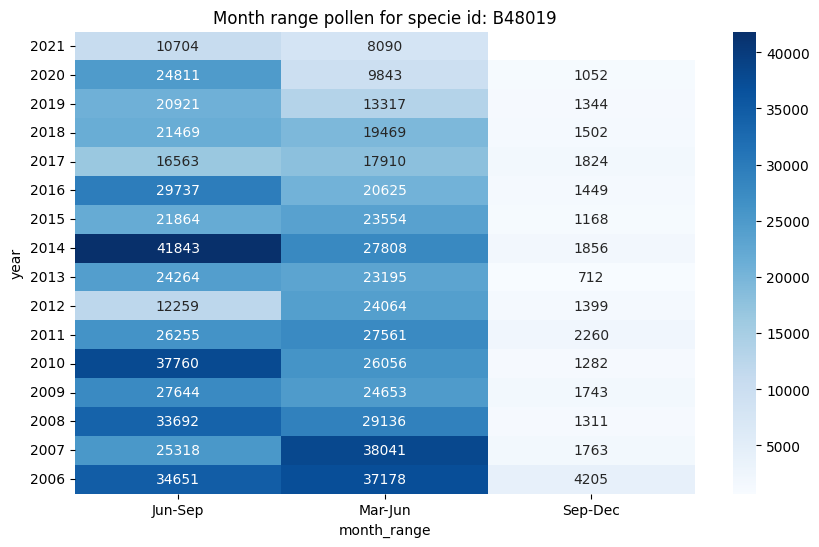

None

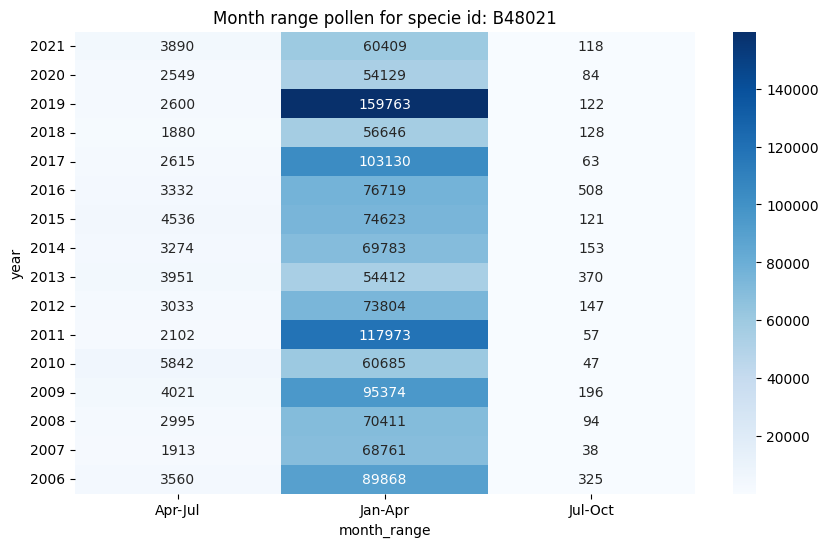

None

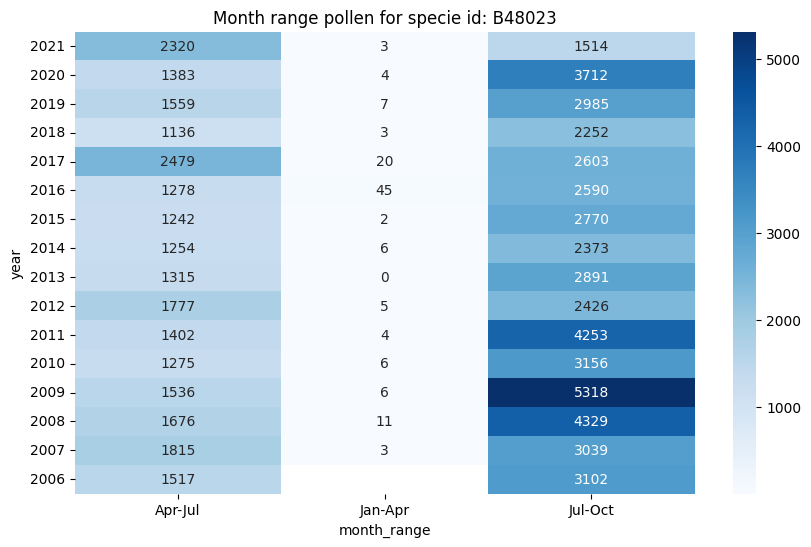

None

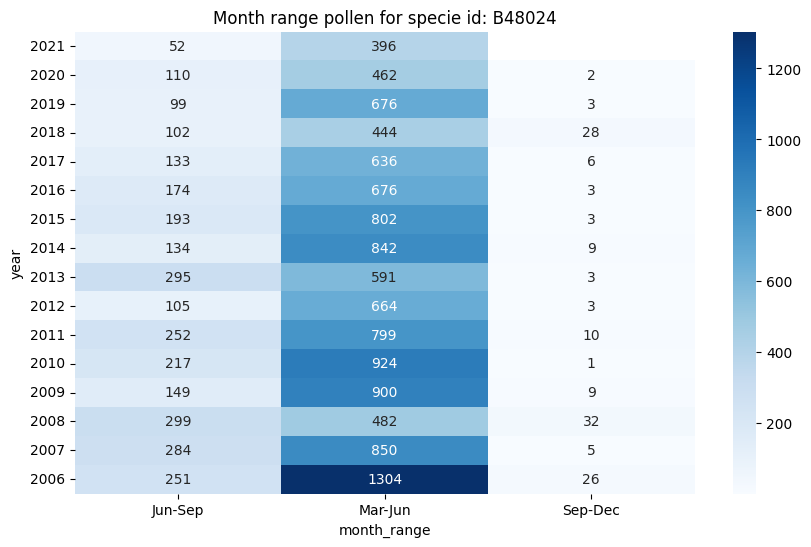

None

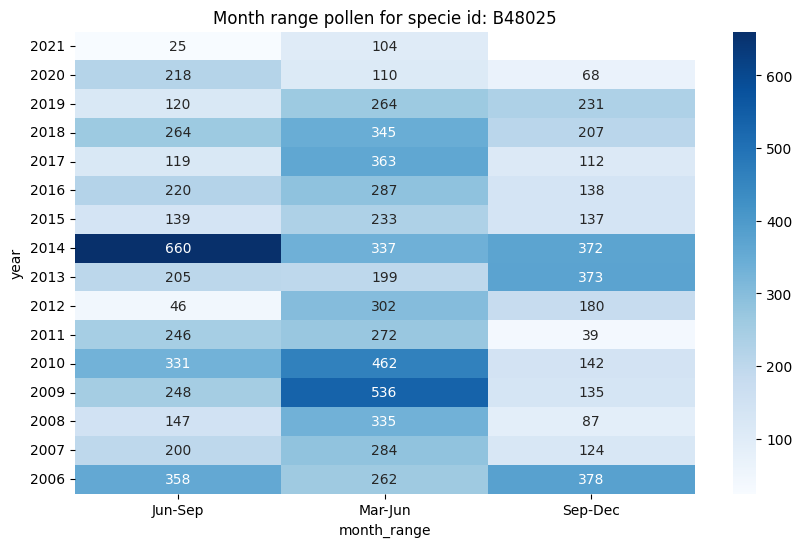

None

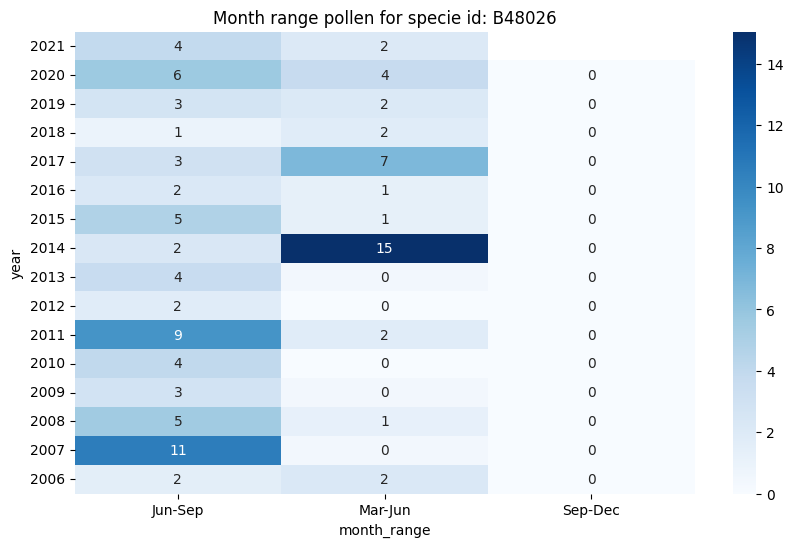

None

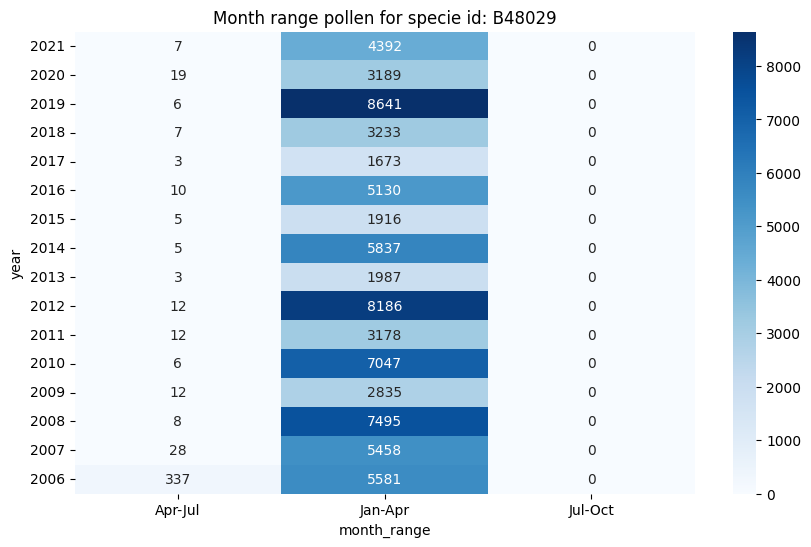

None

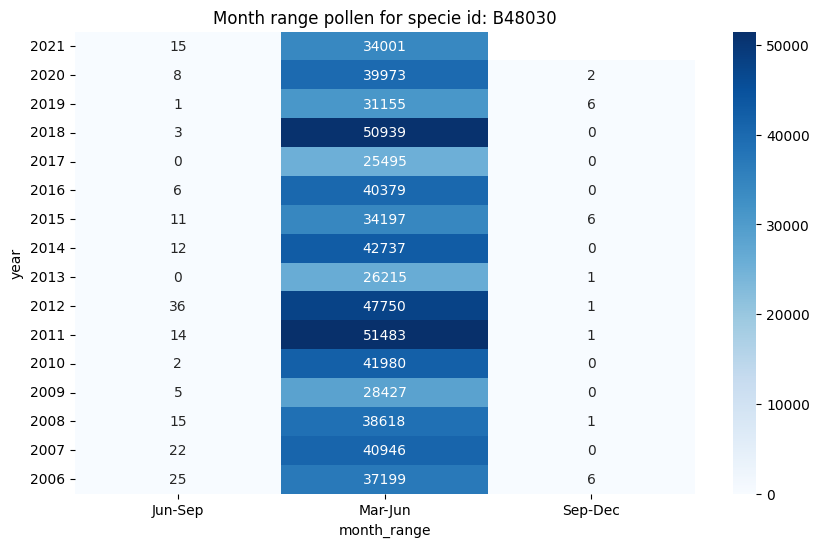

None

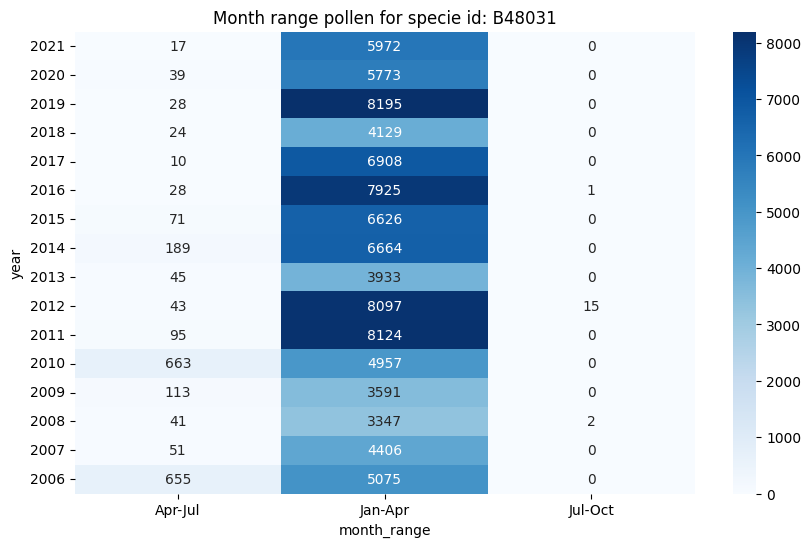

None

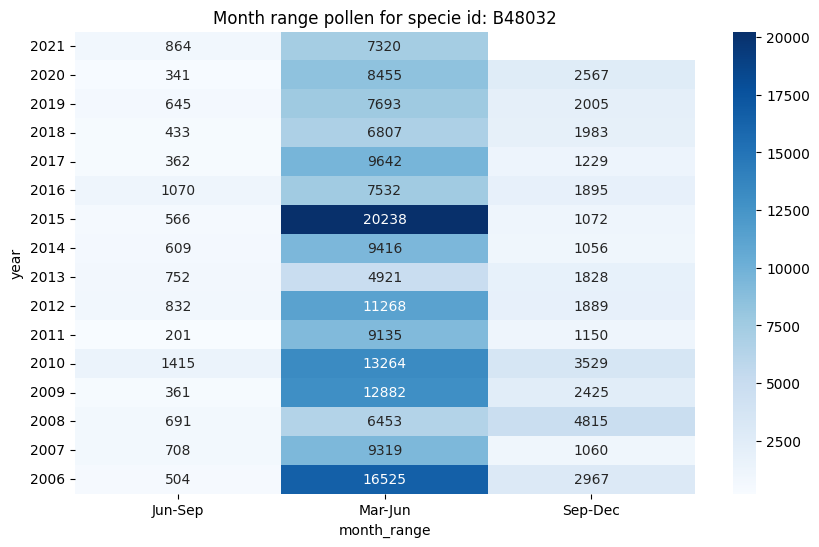

None

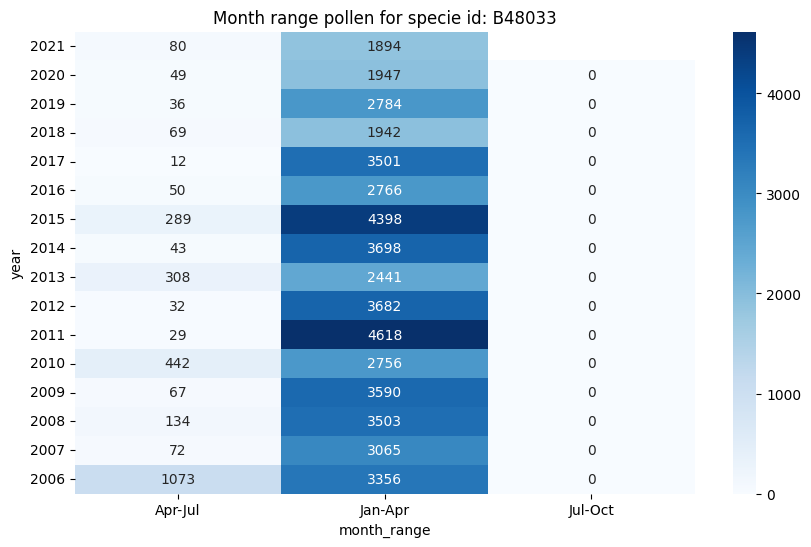

None

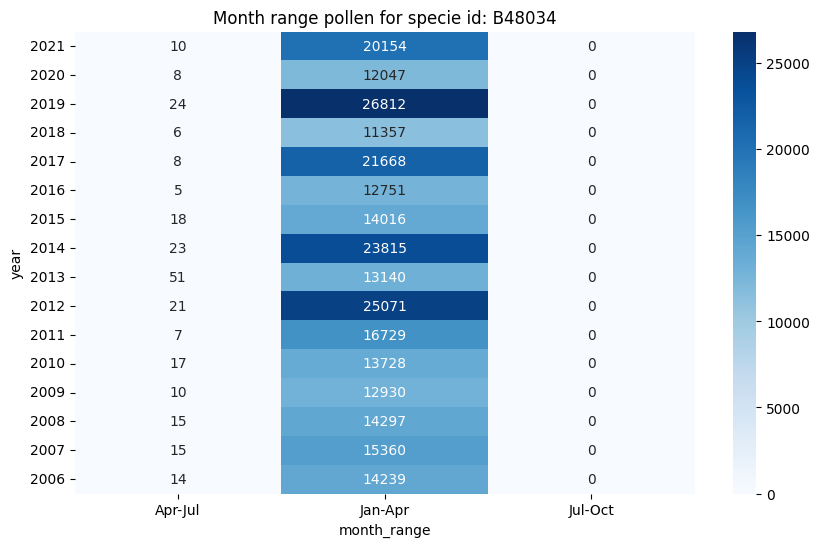

None

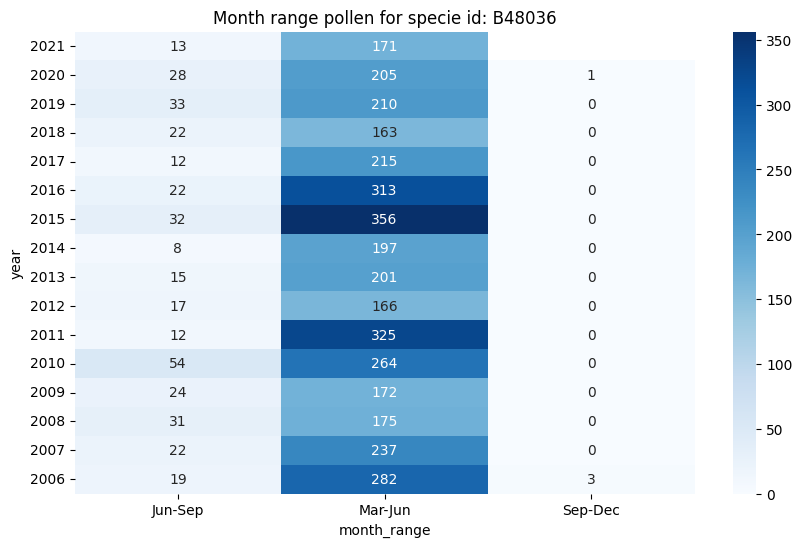

None

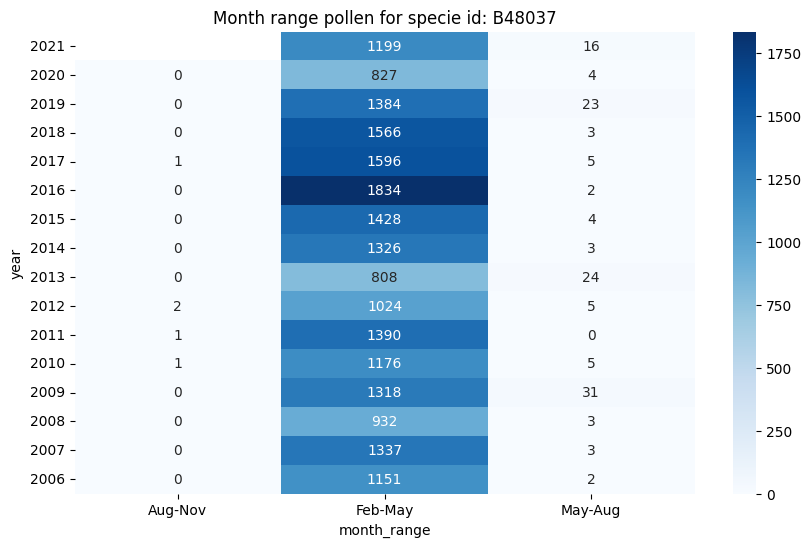

None

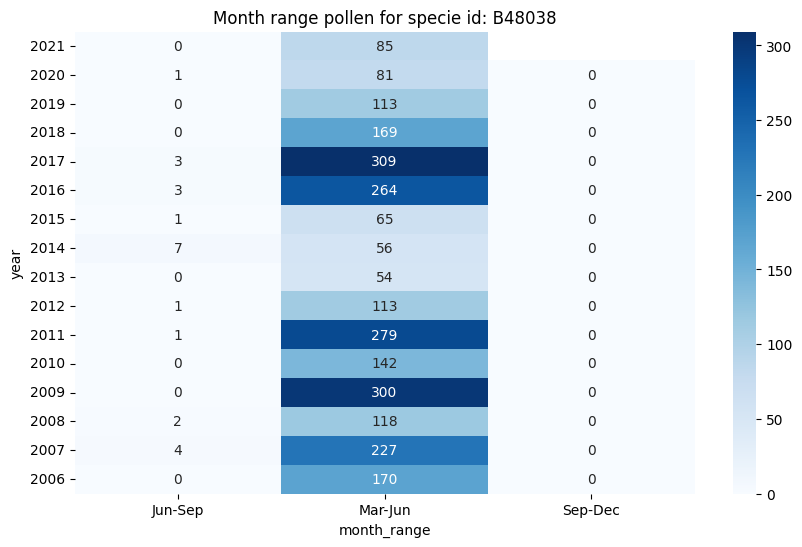

None

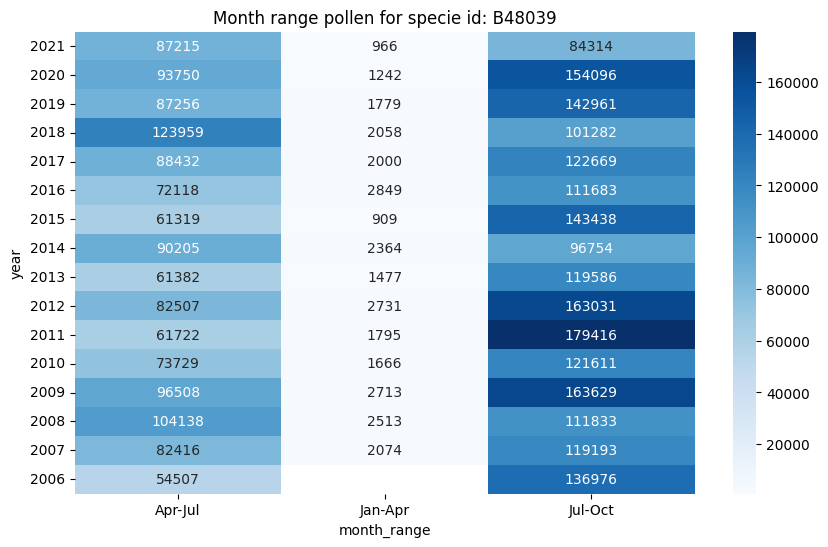

None

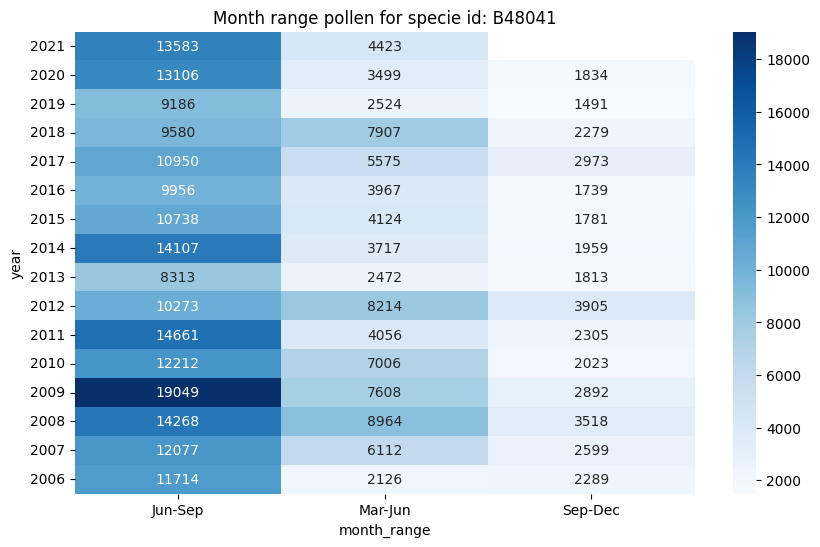

None

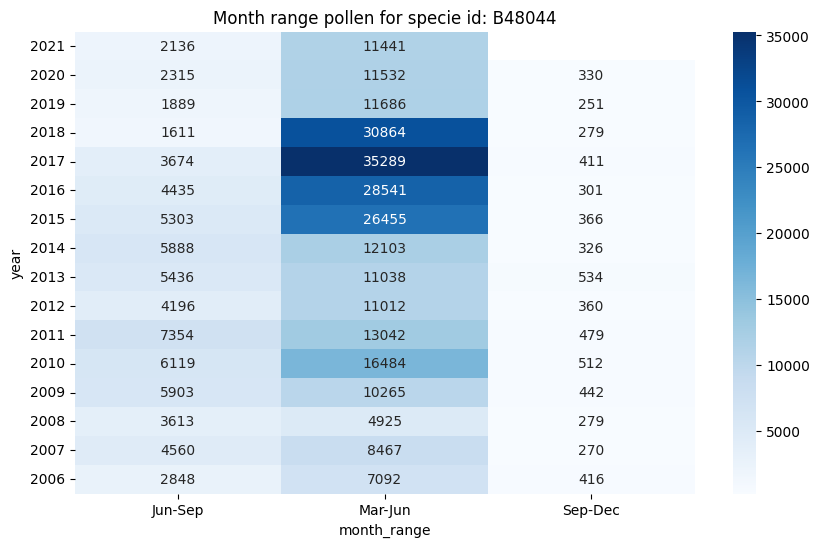

None

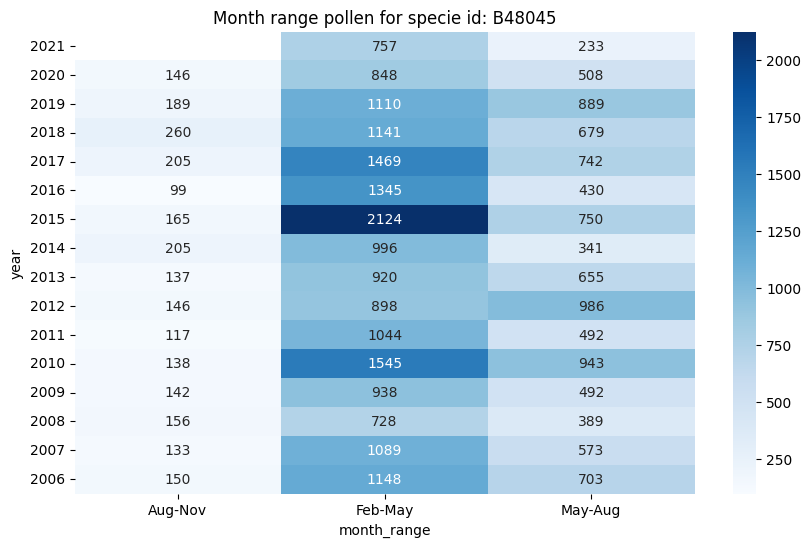

None

In [34]:
for pol_id, df_pol in df.groupby("pol_var_id"):
    plot_pol_month_range(df_pol, month_frequency=3);

# 6. All Meteo & Pollen historical data

## 6.1 Meteo & Pollen per station
* Plotting all single station features (PREC, b_codes, pol value)

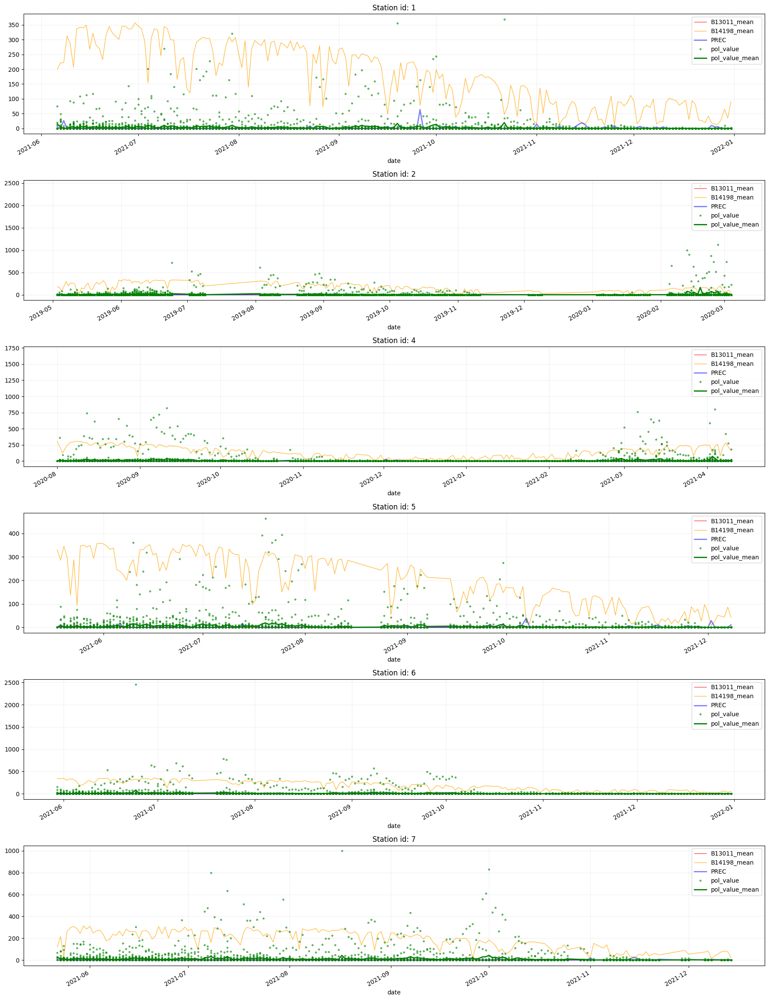

In [35]:
### Plot data unscaled
rows, cols = 11, 1
fig, axs = plt.subplots(rows, cols, figsize=(18,42), squeeze=False)

for subpltn, (station_id, station_data) in enumerate(df.groupby("station_id")):      
    ### Prepare data
    station_data = station_data.copy()
    station_data.sort_values("date", inplace=True)
    station_data = station_data[-5000:]
    ax = axs[divmod(subpltn, cols)] ### sub plot index
    
    ### Meteo features
    station_data.plot(x="date", y="B13011_mean", lw=1, alpha=.75, ax=ax, c="red")
    station_data.plot(x="date", y="B14198_mean", lw=1, alpha=.75, ax=ax, c="orange")
    station_data.plot(x="date", y="PREC", lw=2, alpha=.5, ax=ax, c="blue")
    
    ### POL_mean values
    station_data.plot(x="date", y="pol_value", markersize=5, lw=2, alpha=.5, ax=ax, c="green", style=".")
    polmean = station_data.groupby("date")["pol_value"].mean()
    polmean.plot(x="date", y="pol_value", lw=2, alpha=1, ax=ax, c="green", label="pol_value_mean")
    
    ### Plot settings
    ax.set_title(f"Station id: {station_id}")
    ax.legend(loc="upper right")
    ax.grid(alpha=.2)
    
    ### Limit station plots
    if subpltn==5: break

for subpltn in range(subpltn+1, rows*cols): fig.delaxes(axs.flatten()[subpltn]) # removing empty plots from subplot grid
plt.tight_layout()
plt.show();

## 6.2 EWM best alpha-value

To improve plot readability, we will rescale the date values to a normalized range between 0 and 1.

In [36]:
# MinMax normalize species, meteo values
def min_max_scale(x):
    return (x - x.min()) / (x.max() - x.min())

df_scaled = df.copy()
# df_scaled = df_scaled[df_scaled.pol_value > 0]

df_scaled.pol_value = df_scaled.groupby('pol_var_id')['pol_value'].apply(min_max_scale)

df_scaled.TEMP_min = min_max_scale(df_scaled.TEMP_min)
df_scaled.TEMP_max = min_max_scale(df_scaled.TEMP_max)
df_scaled.TEMP_mean = min_max_scale(df_scaled.TEMP_mean)
df_scaled.TEMP_std = min_max_scale(df_scaled.TEMP_std)

df_scaled.PREC = min_max_scale(df_scaled.PREC)
df_scaled.B13011_mean = min_max_scale(df_scaled.B13011_mean)
df_scaled.B14198_mean = min_max_scale(df_scaled.B14198_mean)

* Evaluating the best alpha value for each station/specie pol values. We aim to maximaze the correlation among precipitations and pollen.

,station_id,specie_id,best_alpha,best_corr
0,1,B48001,0.12,-0.029249
1,1,B48002,0.03,0.052933
2,1,B48003,0.05,0.040316
3,1,B48005,0.01,0.034051
4,1,B48006,0.01,0.034160
...,...,...,...,...
358,13,B48038,0.13,0.053171
359,13,B48039,0.01,-0.004024
360,13,B48041,1.00,0.016800
361,13,B48044,0.09,-0.047899


<Axes: >

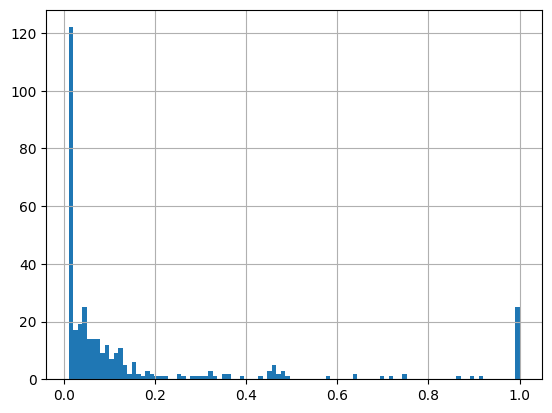

In [37]:
df_ewm_alpha = []
for (station_id, specie_id), station_data in df_scaled.groupby(["station_id", "pol_var_id"]):
    # Prepare data
    station_data = station_data.copy()
    station_data.sort_values("date", inplace=True)
        
    alpha_values = np.arange(0.01, 1.01, 0.01)
    ema_values = [station_data.pol_value.ewm(alpha=alpha).mean() for alpha in alpha_values] # Calculate the EMA of the first time series for each smoothing factor
    corr_values = [np.corrcoef(ema, station_data.PREC)[0, 1] for ema in ema_values] # Calculate the correlation between each EMA and the second time series
    best_index = np.argmax(corr_values) # Find the index of the smoothing factor with the highest correlation
    best_alpha = alpha_values[best_index] # Get the best smoothing factor and EMA
    best_ema = ema_values[best_index] # Get the best EMA values
    df_ewm_alpha.append({"station_id": station_id, "specie_id": specie_id, "best_alpha": best_alpha, "best_corr": corr_values[best_index]})

df_ewm_alpha = pd.DataFrame(df_ewm_alpha)
display(df_ewm_alpha)
display(df_ewm_alpha.best_alpha.hist(bins=100));

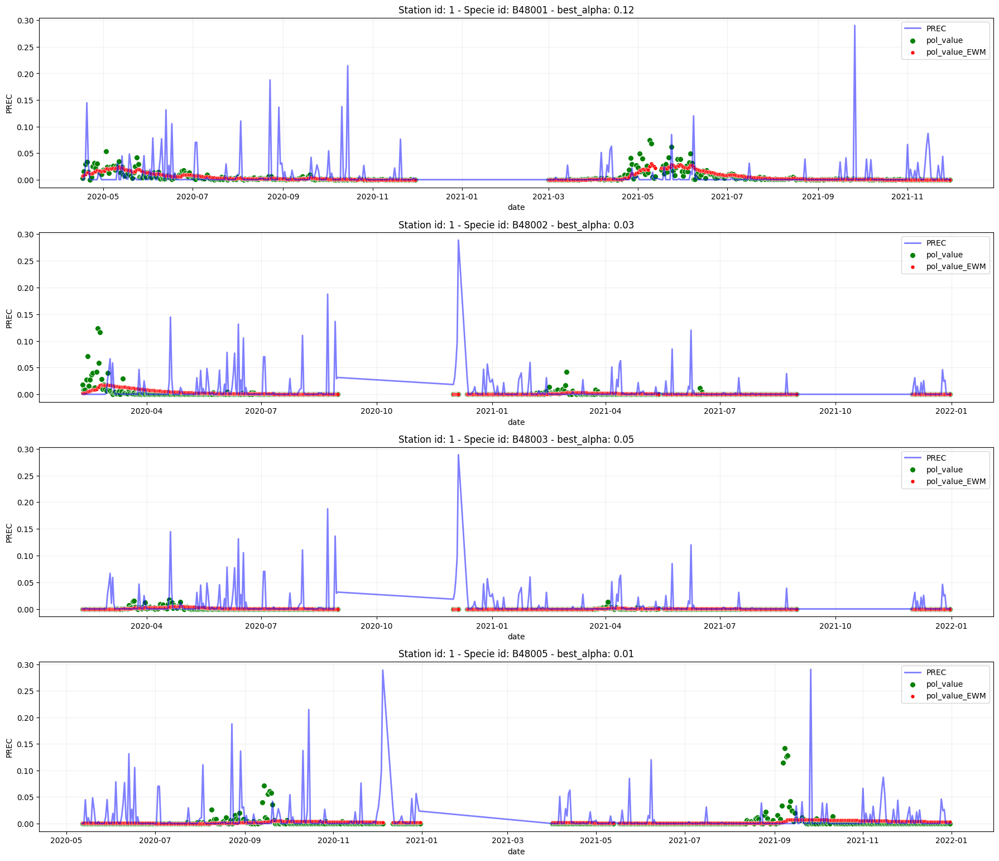

In [38]:
### Plot data unscaled
rows, cols = 11, 1
fig, axs = plt.subplots(rows, cols, figsize=(18,42), squeeze=False)

for subpltn, ((station_id, specie_id), station_data) in enumerate(df_scaled.groupby(["station_id", "pol_var_id"])):
    ### Prepare data
    station_data = station_data.copy()
    station_data.sort_values("date", inplace=True)
    ax = axs[divmod(subpltn, cols)] # sub plot index
    
    alpha_values = np.arange(0.01, 1.01, 0.01)
    ema_values = [station_data.pol_value.ewm(alpha=alpha).mean() for alpha in alpha_values] # Calculate the EMA of the first time series for each smoothing factor
    corr_values = [np.corrcoef(ema, station_data.PREC)[0, 1] for ema in ema_values] # Calculate the correlation between each EMA and the second time series
    best_index = np.argmax(corr_values) # Find the index of the smoothing factor with the highest correlation
    best_alpha = alpha_values[best_index] # Get the best smoothing factor and EMA
    best_ema = ema_values[best_index] # Get the best EMA values

    station_data = station_data[-500:]

    ### Meteo features
    sns.lineplot(data=station_data, x="date", y="PREC", lw=2, alpha=.5, ax=ax, c="blue", label="PREC")

    ### POL_mean values
    sns.scatterplot(x=station_data.date, y=station_data.pol_value, s=50, alpha=1, ax=ax, c="green", label="pol_value")
    sns.scatterplot(x=station_data.date, y=best_ema, s=25, alpha=1, ax=ax, c="red", label="pol_value_EWM")
    
    ### Plot settings
    ax.set_title(f"Station id: {station_id} - Specie id: {specie_id} - best_alpha: {best_alpha}")
    ax.legend(loc="upper right")
    ax.grid(alpha=.2)
    if subpltn==3: break

for subpltn in range(subpltn+1, rows*cols): fig.delaxes(axs.flatten()[subpltn]) # removing empty plots from subplot grid
plt.tight_layout()
plt.show();

# 7. Weekly Meteo & Pollen historical data

## 7.1 Weekly Meteo & Pollen per station

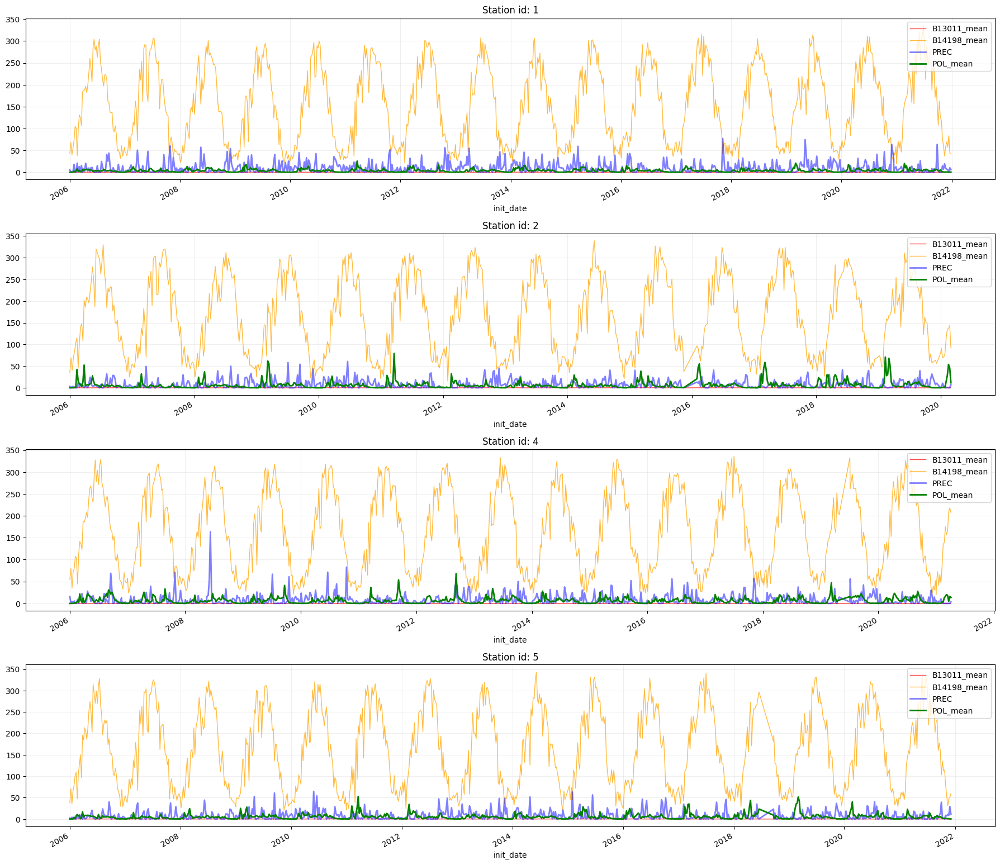

In [39]:
### Plot data unscaled
rows, cols = 11, 1
fig, axs = plt.subplots(rows, cols, figsize=(18,42), squeeze=False)

for subpltn, (station_id, station_data) in enumerate(df_weekly.groupby("station_id")):      
    ### Prepare data
    station_data = station_data.copy()
    station_data.sort_values("init_date", inplace=True)
    #station_data = station_data[-1500:]

    ### Sub plot index
    ax = axs[divmod(subpltn, cols)]

    ### Meteo features
    station_data.plot(x="init_date", y="B13011_mean", lw=1, alpha=.75, ax=ax, c="red")
    station_data.plot(x="init_date", y="B14198_mean", lw=1, alpha=.75, ax=ax, c="orange")
    station_data.plot(x="init_date", y="PREC", lw=2, alpha=.5, ax=ax, c="blue")
    
    ### POL_mean values
    #station_data.plot(x="init_date", y="POL_mean", marker=".", markersize=1, lw=0, alpha=.75, ax=ax, c="green")
    polmean = station_data.groupby("init_date")["POL_mean"].mean()
    polmean.plot(x="init_date", y="POL_mean", lw=2, alpha=1, ax=ax, c="green", label="POL_mean")
    
    ### Plot settings
    ax.set_title(f"Station id: {station_id}")
    ax.legend(loc="upper right")
    ax.grid(alpha=.2)
    #ax.set_ylim(top=.8)
    
    ### Limit subplot number
    if subpltn==3: break

### Remove empty plots from subplot grid
for subpltn in range(subpltn+1, rows*cols): fig.delaxes(axs.flatten()[subpltn])
plt.tight_layout()
plt.show();

In [40]:
# MinMax normalize species, meteo values
df_scaled = df_weekly.copy()
df_scaled = df_scaled[df_scaled.POL_mean > 0]

df_scaled.POL_mean = df_scaled.groupby('pol_var_id')['POL_mean'].apply(min_max_scale)

df_scaled.TEMP_min = min_max_scale(df_scaled.TEMP_min)
df_scaled.TEMP_max = min_max_scale(df_scaled.TEMP_max)
df_scaled.TEMP_mean = min_max_scale(df_scaled.TEMP_mean)
df_scaled.TEMP_std = min_max_scale(df_scaled.TEMP_std)

df_scaled.PREC = min_max_scale(df_scaled.PREC)
df_scaled.B13011_mean = min_max_scale(df_scaled.B13011_mean)
df_scaled.B14198_mean = min_max_scale(df_scaled.B14198_mean)

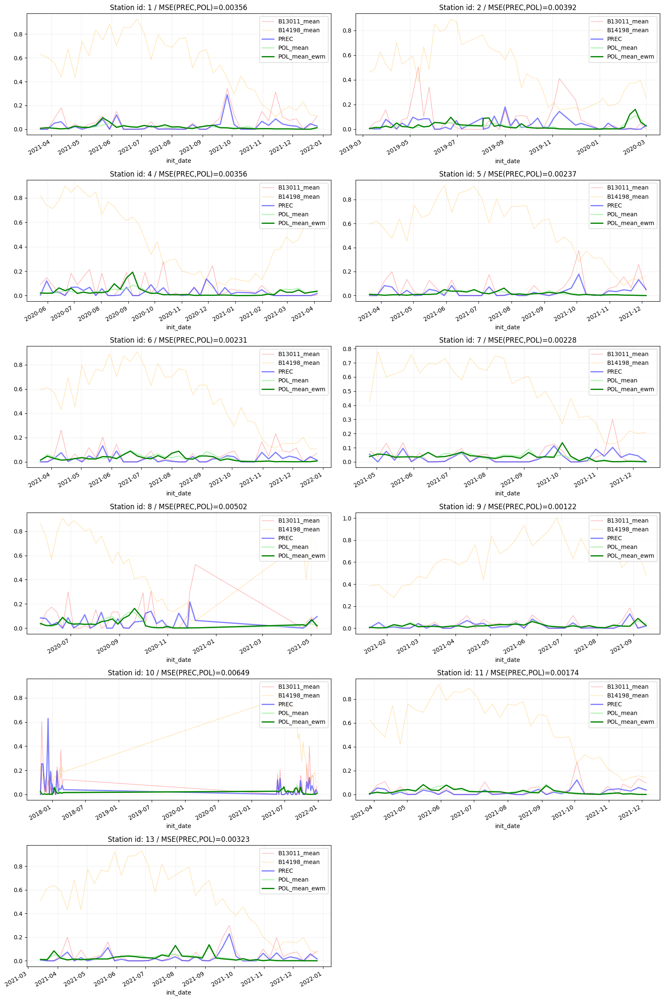

In [41]:
prec_pollen_errs = {}
rows, cols = 6, 2
fig, axs = plt.subplots(rows, cols, figsize=(16,24), squeeze=False)

for subpltn, (station_id, station_data) in enumerate(df_scaled.groupby("station_id")):
    ### Prepare data
    station_data = station_data.copy()
    station_data.sort_values("init_date", inplace=True)
    station_data = station_data[-500:]

    ### Sub plot index
    ax = axs[divmod(subpltn, cols)]
    
    ### Meteo features
    station_data.plot(x="init_date", y="B13011_mean", lw=1, alpha=.3, ax=ax, c="red")
    station_data.plot(x="init_date", y="B14198_mean", lw=1, alpha=.3, ax=ax, c="orange")
    station_data.plot(x="init_date", y="PREC", lw=2, alpha=.5, ax=ax, c="blue")
    
    ### POL_mean values
    #station_data.plot(x="init_date", y="POL_mean", marker=".", markersize=1, lw=0, alpha=.75, ax=ax, c="green")
    polmean = station_data.groupby("init_date")["POL_mean"].mean()
    polmean.plot(x="init_date", y="POL_mean", lw=2, alpha=.6, ax=ax, c="lightgreen", label="POL_mean")
    mse = mean_squared_error(station_data.groupby("init_date")["PREC"].mean(), polmean.values).round(5)
    prec_pollen_errs[station_id] = {"POL_mean": mse}
    
    #polmean ewm
    polmean = station_data.groupby("init_date")["POL_mean"].ewm(alpha=.2, adjust=False).mean().reset_index()
    polmean.groupby("init_date")["POL_mean"].mean().plot(x="init_date", y="POL_mean", lw=2, alpha=1, ax=ax, c="green", label="POL_mean_ewm")
    mse = mean_squared_error(station_data.PREC, polmean.POL_mean).round(5)
    prec_pollen_errs[station_id]["POL_mean_ewm"] = mse
    
    ### Plot settings
    ax.set_title(f"Station id: {station_id} / MSE(PREC,POL)={mse}")
    ax.legend(loc="upper right")
    ax.grid(alpha=.2)
    #ax.set_ylim(top=.8)
    #if subpltn==1: break

### Remove empty plots from subplot grid
for subpltn in range(subpltn+1, rows*cols): fig.delaxes(axs.flatten()[subpltn])
plt.tight_layout()
plt.show();

In [42]:
prec_pollen_errs = pd.DataFrame(prec_pollen_errs).T
prec_pollen_errs.style.highlight_min(color='green', axis=1).highlight_max(color='red', axis=1)

,POL_mean,POL_mean_ewm
1,0.003010,0.003560
2,0.002990,0.003920
4,0.002090,0.003560
5,0.002290,0.002370
6,0.001970,0.002310
7,0.002040,0.002280
8,0.005470,0.005020
9,0.000960,0.001220
10,0.013740,0.006490
11,0.001300,0.001740


## 7.2 Meteo & Pollen per specie/station

In [43]:
df_scaled = df.copy()
# df_scaled = df_scaled[df_scaled.pol_value > 0]
df_scaled.sort_values(['station_id', 'pol_var_id', "date"], inplace=True)

df_scaled.pol_value = df_scaled.groupby('pol_var_id')['pol_value'].apply(min_max_scale)
# df_scaled.POL_mean = df_scaled.groupby('pol_var_id')['POL_mean'].apply(min_max_scale)
df_scaled.PREC = min_max_scale(df_scaled.PREC)
df_scaled.TEMP_min = min_max_scale(df_scaled.TEMP_min)
df_scaled.TEMP_max = min_max_scale(df_scaled.TEMP_max)
df_scaled.TEMP_mean = min_max_scale(df_scaled.TEMP_mean)
df_scaled.TEMP_std = min_max_scale(df_scaled.TEMP_std)
df_scaled.B13011_mean = min_max_scale(df_scaled.B13011_mean)
df_scaled.B14198_mean = min_max_scale(df_scaled.B14198_mean)

In [44]:
station_wgt = _create_station_widget(df)
display(station_wgt)

pol_id_wgt = _create_pol_var_id_widget(df)
display(pol_id_wgt)

Dropdown(description='Station Id:', layout=Layout(width='50%'), options=(1, 2, 4, 5, 6, 7, 8, 9, 10, 11, 13), …

Dropdown(description='Pol var id:', layout=Layout(width='50%'), options=('B48001', 'B48002', 'B48003', 'B48005…

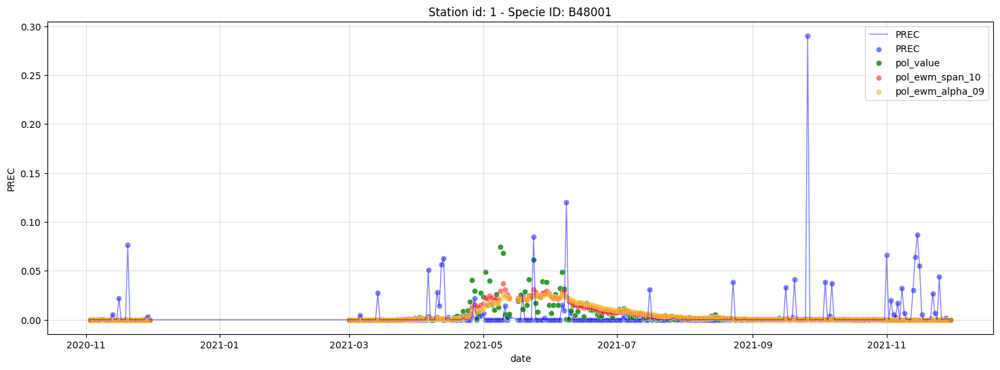

In [45]:
specie_data = df_scaled[(df_scaled.station_id == station_wgt.value) & (df_scaled.pol_var_id == pol_id_wgt.value)]
specie_data.sort_values("date", inplace=True)
view = specie_data[-300:]

plt.figure(figsize=(18,6))
plt.title(f"Station id: {station_wgt.value} - Specie ID: {pol_id_wgt.value}")
sns.lineplot(data=view, x="date", y="PREC", lw=1, alpha=.5, c="blue", label="PREC")
sns.scatterplot(data=view, x="date", y="PREC", lw=1, alpha=.5, c="blue", label="PREC")

### pol_value
sns.scatterplot(data=view, x="date", y="pol_value", lw=1, alpha=.8, c="green", label="pol_value")

pol_ewm = view.pol_value.ewm(span=10).mean()
sns.scatterplot(x=view.date, y=pol_ewm, lw=1, alpha=.5, c="red", label="pol_ewm_span_10")

pol_ewm = view.pol_value.ewm(alpha=0.09).mean()
sns.scatterplot(x=view.date, y=pol_ewm, lw=1, alpha=.5, c="orange", label="pol_ewm_alpha_09")
plt.legend(loc="upper right")
plt.grid(alpha=.4)
plt.show()